In [ ]:
#pip install geopandas

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import xml.etree.ElementTree as ET
import zipfile
import os

# Load the main dataset (residents with accessibility scores)
residents_df = pd.read_csv("MumbaiScoreV1.csv")

In [ ]:
#residents_df

In [ ]:
import geopandas as gpd
from shapely.geometry import Point
from xml.etree import ElementTree as ET
import pandas as pd

# Helper function to parse KML and return GeoDataFrame
def parse_kml_to_gdf(kml_path):
    tree = ET.parse(kml_path)
    root = tree.getroot()
    namespace = {'kml': 'http://www.opengis.net/kml/2.2'}

    names = []
    coords = []

    for placemark in root.findall('.//kml:Placemark', namespace):
        name = placemark.find('kml:name', namespace)
        coord = placemark.find('.//kml:coordinates', namespace)
        if name is not None and coord is not None:
            names.append(name.text)
            coord_text = coord.text.strip()
            lon, lat, *_ = map(float, coord_text.split(','))
            coords.append(Point(lon, lat))

    return gpd.GeoDataFrame({'name': names, 'geometry': coords}, crs="EPSG:4326")

# Mumbai-specific facilities with independent scores
facilities = {
    "Transport_Score": "mumbai-best-bus-stops-depots.kml",
    "School_Municipal": "mumbai-municipal-primary-secondary-schools.kml",
    "School_Unaided": "mumbai-unaided-schools.kml",
    "School_Aided": "mumbai-aided-schools.kml",
    "Fire_Score": "mumbai-fire-stations.kml",
    "Hospital_Score": "mumbai-hospitals.kml",
    "Park_Score": "mumbai-gardens-parks-playgrounds.kml",
    "Toilet_Score": "mumbai-toilets.kml",
}

# Load KMLs into separate GeoDataFrames
facilities_gdfs = {name: parse_kml_to_gdf(path) for name, path in facilities.items()}

# Example (Uncomment if needed): Load residents DataFrame
# residents_df = pd.read_csv("residents_with_scores.csv")

# Convert residents DataFrame into GeoDataFrame
residents_gdf = gpd.GeoDataFrame(
    residents_df,
    geometry=gpd.points_from_xy(residents_df.longitude, residents_df.latitude),
    crs="EPSG:4326"
)


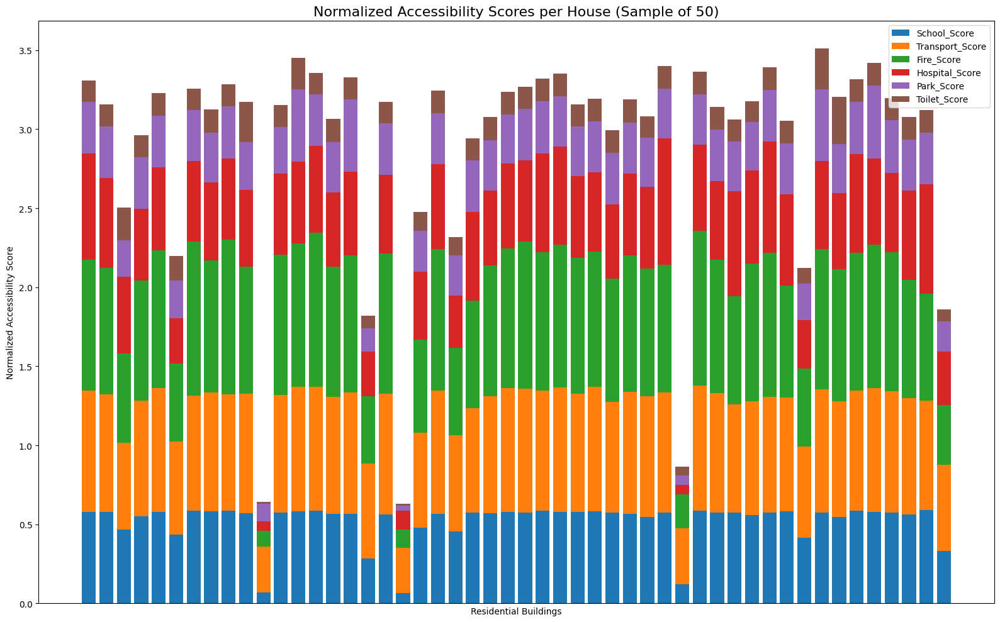

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Load Mumbai data
residents_df = pd.read_csv("MumbaiScoreV1.csv")

# Identify score columns ending with '_Score'
score_columns = [col for col in residents_df.columns if col.endswith('_Score')]

# Normalize the score columns
scaler = MinMaxScaler()
normalized_scores = scaler.fit_transform(residents_df[score_columns])
normalized_df = pd.DataFrame(normalized_scores, columns=[f"{col}_Norm" for col in score_columns])

# Add normalized scores to the original DataFrame
residents_df = pd.concat([residents_df, normalized_df], axis=1)

# Sample 50 buildings for plotting
sample_residents = residents_df.sample(50, random_state=42)

# Column names for plotting
norm_columns = [f"{col}_Norm" for col in score_columns]
bottom = None

# Plot
fig, ax = plt.subplots(figsize=(16, 10))

for idx, col in enumerate(norm_columns):
    if idx == 0:
        ax.bar(sample_residents['Building'], sample_residents[col], label=score_columns[idx])
        bottom = sample_residents[col].values
    else:
        ax.bar(sample_residents['Building'], sample_residents[col], bottom=bottom, label=score_columns[idx])
        bottom += sample_residents[col].values

ax.set_title('Normalized Accessibility Scores per House (Sample of 50)', fontsize=16)
ax.set_xlabel('Residential Buildings')
ax.set_ylabel('Normalized Accessibility Score')
ax.legend(loc='upper right')
ax.tick_params(axis='x', which='both', bottom=False, labelbottom=False)  # Hide labels for clarity

plt.tight_layout()
plt.show()


In [2]:
import matplotlib.pyplot as plt
import contextily as ctx

# Reproject GeoDataFrame to Web Mercator (required by contextily)
residents_gdf_web = residents_gdf.to_crs(epsg=3857)

# Calculate total score again (if needed)
residents_gdf_web['Total_Score'] = residents_gdf_web[[
    'Fire_Score',
    'Hospital_Score',
    'Park_Score',
    'Toilet_Score',
    'School_Score',
    'Transport_Score'
]].sum(axis=1)

# Plot with base map
fig, ax = plt.subplots(figsize=(12, 9))
residents_gdf_web.plot(
    ax=ax,
    column='Total_Score',
    cmap='RdYlGn',
    legend=True,
    markersize=15,
    alpha=0.8,
    edgecolor='k',
    linewidth=0.2
)

# Add base map (CartoDB Positron is light and elegant)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Final touches
ax.set_title("Mumbai Accessibility Heatmap (with Basemap)", fontsize=16)
ax.set_axis_off()  # Hide axis ticks and labels for clean look
plt.tight_layout()
plt.show()


NameError: name 'residents_gdf' is not defined

In [ ]:
import matplotlib.pyplot as plt

# Calculate total accessibility score (excluding Meal_Score)
residents_gdf['Total_Score'] = residents_gdf[[
    'Fire_Score',
    'Hospital_Score',
    'Park_Score',
    'Toilet_Score',
    'School_Score',
    'Transport_Score'
]].sum(axis=1)

# Plot heatmap-style scatter of total scores
fig, ax = plt.subplots(figsize=(10, 8))
residents_gdf.plot(
    ax=ax,
    column='Total_Score',
    cmap='RdYlGn',
    legend=True,
    markersize=15,
    alpha=0.7
)

plt.title("Government View: Accessibility Score Heatmap for Residences", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import geopandas as gpd
from shapely.geometry import Point

# Get bounding box from residents_gdf
minx, miny, maxx, maxy = residents_gdf.total_bounds

# Utility: Generate random points within bounding box
def generate_random_facilities(n, minx, maxx, miny, maxy):
    lons = np.random.uniform(minx, maxx, n)
    lats = np.random.uniform(miny, maxy, n)
    return gpd.GeoDataFrame(geometry=[Point(lon, lat) for lon, lat in zip(lons, lats)], crs="EPSG:4326")

# Define how many new facilities you want for each category
new_facility_counts = {
    "new_fire": 5,
    "new_hospitals": 5,
    "new_schools": 5,
    "new_parks": 5,
    "new_toilets": 5,
    "new_transport": 5
}

# Generate new simulated facilities
new_facilities = {
    name: generate_random_facilities(count, minx, maxx, miny, maxy)
    for name, count in new_facility_counts.items()
}

# You can now access, for example:
# new_facilities['new_fire']
# new_facilities['new_hospitals']


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Combine all Mumbai facility GeoDataFrames
all_facilities_gdf = pd.concat(facilities_gdfs.values(), ignore_index=True)
all_facilities_gdf = all_facilities_gdf.to_crs(epsg=3857)  # Web Mercator for metric units

# Extract X/Y coordinates
x = all_facilities_gdf.geometry.x
y = all_facilities_gdf.geometry.y

# Hexbin plot
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_title("Urban Planners View: Mumbai Facility Density Map", fontsize=16)
ax.set_xlabel("Easting (meters)")
ax.set_ylabel("Northing (meters)")

hb = ax.hexbin(x, y, gridsize=50, cmap='plasma', mincnt=1)
cb = fig.colorbar(hb, ax=ax)
cb.set_label("Number of Facilities per Hex")

plt.tight_layout()
plt.show()

In [ ]:
#pip install geopy

In [3]:
from geopy.distance import geodesic
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Select 6 random buildings for the simulation
selected_residents = residents_gdf.sample(6, random_state=1).copy()

# Define a new toilet location in Mumbai (central coordinates)
new_facility_location = Point(72.85, 19.07)  # e.g., around South Mumbai

# Function to simulate score change based on proximity
def simulate_score_change(row, new_point, threshold_km=1.0):
    dist = geodesic((row.geometry.y, row.geometry.x), (new_point.y, new_point.x)).km
    if dist < threshold_km:
        return min(row['Toilet_Score'] + (1 - dist / threshold_km) * 2.0, 10.0)  # max score = 10
    return row['Toilet_Score']

# Apply the simulation
selected_residents['New_Toilet_Score'] = selected_residents.apply(
    lambda row: simulate_score_change(row, new_facility_location), axis=1)

# Plot before vs after Toilet_Score for selected buildings
labels = selected_residents['Building']
before_scores = selected_residents['Toilet_Score']
after_scores = selected_residents['New_Toilet_Score']

x = np.arange(len(labels))  # label locations
width = 0.35  # width of the bars

fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(x - width/2, before_scores, width, label='Before')
rects2 = ax.bar(x + width/2, after_scores, width, label='After')

# Add labels and formatting
ax.set_ylabel('Toilet Accessibility Score')
ax.set_title('Impact of New Toilet Facility on Nearby Residences')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.legend()

plt.tight_layout()
plt.show()


NameError: name 'residents_gdf' is not defined

NameError: name 'residents_gdf' is not defined

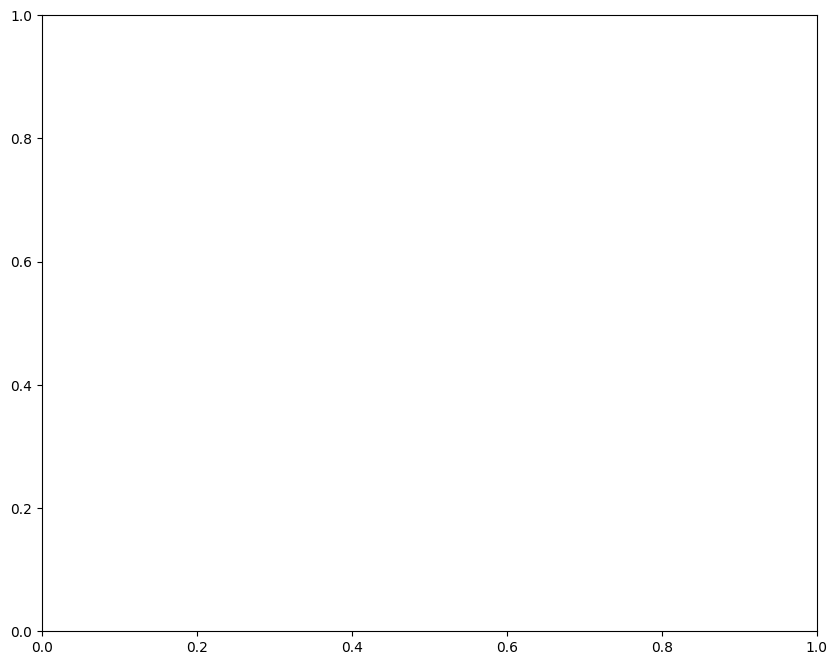

In [4]:
import matplotlib.pyplot as plt
import geopandas as gpd

fig, ax = plt.subplots(figsize=(10, 8))

# Plot all buildings faintly in background
residents_gdf.plot(
    ax=ax,
    color='lightgray',
    markersize=5,
    alpha=0.3,
    label='Other Buildings'
)

# Plot selected buildings - original score
selected_residents.plot(
    ax=ax,
    column='Toilet_Score',
    cmap='Blues',
    markersize=80,
    alpha=0.6,
    legend=True,
    label='Toilet Score (Before)'
)

# Plot selected buildings - new score
selected_residents.plot(
    ax=ax,
    column='New_Toilet_Score',
    cmap='Greens',
    markersize=40,
    alpha=0.8,
    label='Toilet Score (After)'
)

# Plot the new toilet location
gpd.GeoSeries([new_facility_location], crs="EPSG:4326").plot(
    ax=ax,
    color='red',
    marker='*',
    markersize=200,
    label='New Toilet Facility'
)

# Annotate selected buildings with Building ID
for idx, row in selected_residents.iterrows():
    ax.annotate(row['Building'], xy=(row.geometry.x, row.geometry.y),
                xytext=(3, 3), textcoords="offset points", fontsize=8)

# Final plot formatting
plt.title("Scenario Simulation: Impact of New Toilet Facility on Nearby Buildings", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [5]:
from shapely.geometry import Point
import matplotlib.pyplot as plt
import geopandas as gpd

# Define a central point in Mumbai (e.g., around CST or Fort)
central_point = Point(72.85, 19.07)
buffer_radius = 0.01  # Roughly ~1.1 km

# Select nearby residents within this buffer
nearby_residents = residents_gdf[residents_gdf.geometry.within(central_point.buffer(buffer_radius))].copy()
nearby_residents = nearby_residents.head(20)  # Limit to top 20 for clarity

# Reuse the new toilet facility defined earlier (also in Mumbai)
# new_facility_location = Point(72.85, 19.07)

# Simulate improved toilet score
nearby_residents['New_Toilet_Score'] = nearby_residents.apply(
    lambda row: simulate_score_change(row, new_facility_location), axis=1
)

# 🔵 Plot Before
fig, ax = plt.subplots(figsize=(10, 8))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3)
nearby_residents.plot(ax=ax, column='Toilet_Score', cmap='Blues', markersize=80, legend=True)

plt.title("Before: Toilet Accessibility Scores of Nearby Buildings (Mumbai)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# 🟢 Plot After
fig, ax = plt.subplots(figsize=(10, 8))
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3)
nearby_residents.plot(ax=ax, column='New_Toilet_Score', cmap='Greens', markersize=80, legend=True)
gpd.GeoSeries([new_facility_location], crs="EPSG:4326").plot(
    ax=ax, color='red', marker='*', markersize=200, label='New Toilet'
)

plt.title("After: Improved Toilet Scores with New Facility Nearby (Mumbai)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


NameError: name 'residents_gdf' is not defined

In [6]:
from shapely.geometry import Point
from geopy.distance import geodesic
import geopandas as gpd
import matplotlib.pyplot as plt

# Define simulated new facilities in Mumbai
new_facilities = gpd.GeoDataFrame({
    'name': ['New School', 'New Toilet', 'New Park'],
    'type': ['School', 'Toilet', 'Park'],
    'geometry': [
        Point(72.845, 19.07),  # School - central Mumbai
        Point(72.86, 19.06),   # Toilet
        Point(72.83, 19.075)   # Park
    ]
}, crs="EPSG:4326")

# Function to boost score based on proximity
def apply_global_score_boost(row, facility_point, column_name, max_boost=1.5, threshold_km=1.2):
    distance = geodesic((row.geometry.y, row.geometry.x), (facility_point.y, facility_point.x)).km
    if distance < threshold_km:
        return min(row[column_name] + (1 - distance / threshold_km) * max_boost, 10.0)
    return row[column_name]

# Copy base data and simulate score improvements
mumbai_scenario = residents_gdf.copy()
mumbai_scenario['School_Score_New'] = mumbai_scenario.apply(
    lambda r: apply_global_score_boost(r, new_facilities.loc[0, 'geometry'], 'School_Score'), axis=1)
mumbai_scenario['Toilet_Score_New'] = mumbai_scenario.apply(
    lambda r: apply_global_score_boost(r, new_facilities.loc[1, 'geometry'], 'Toilet_Score'), axis=1)
mumbai_scenario['Park_Score_New'] = mumbai_scenario.apply(
    lambda r: apply_global_score_boost(r, new_facilities.loc[2, 'geometry'], 'Park_Score'), axis=1)

# 🔵 BEFORE: Original Park Scores
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Park_Score', cmap='Blues', markersize=10, legend=True, alpha=0.7)
plt.title("Original Park Accessibility Scores - Mumbai")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# 🟢 AFTER: Improved Park Scores with New Facility
fig, ax = plt.subplots(figsize=(12, 10))
mumbai_scenario.plot(ax=ax, column='Park_Score_New', cmap='Greens', markersize=10, legend=True, alpha=0.7)
new_facilities[new_facilities.type == 'Park'].plot(
    ax=ax, color='red', marker='*', markersize=200, label='New Park'
)
plt.title("Scenario Simulation: Improved Park Accessibility with New Facility (Mumbai)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


NameError: name 'residents_gdf' is not defined

In [7]:
# Ensure new facilities match the CRS of residents GeoDataFrame
new_facilities_valid = new_facilities.to_crs(residents_gdf.crs)

# Filter for the new park only
new_park_gdf = new_facilities_valid[new_facilities_valid['type'] == 'Park']

# Plot the improved Park scores and new park location
fig, ax = plt.subplots(figsize=(12, 10))
mumbai_scenario.plot(ax=ax, column='Park_Score_New', cmap='Greens', markersize=10, legend=True, alpha=0.7)

# Plot the simulated park facility if available
if not new_park_gdf.empty:
    new_park_gdf.plot(ax=ax, color='red', marker='*', markersize=200, label='New Park')

plt.title("Scenario Simulation: Improved Park Scores Across Mumbai")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


NameError: name 'residents_gdf' is not defined

In [8]:
from sklearn.neighbors import KernelDensity
from geopy.distance import geodesic
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt

# Step 1: Identify low-score areas for Park (bottom 10th percentile in Mumbai)
threshold = residents_gdf['Park_Score'].quantile(0.1)
low_score_residents = residents_gdf[residents_gdf['Park_Score'] <= threshold]

# Step 2: KDE clustering on low-score residences
xy = np.vstack([low_score_residents.geometry.x, low_score_residents.geometry.y]).T
kde = KernelDensity(bandwidth=0.01, metric='euclidean', kernel='gaussian')
kde.fit(xy)
densities = kde.score_samples(xy)

# Attach densities and select top 5 high-density, low-score locations
low_score_residents = low_score_residents.copy()
low_score_residents['density'] = densities
top_locations = low_score_residents.sort_values('density', ascending=False).head(5)

# Convert top locations to GeoDataFrame
new_park_points = gpd.GeoDataFrame(geometry=top_locations.geometry, crs="EPSG:4326")
new_park_points['name'] = [f'Proposed Park {i+1}' for i in range(len(new_park_points))]

# Step 3: Simulate Park score improvements
def boost_from_multiple(row, points, column_name, max_boost=1.5, threshold_km=1.2):
    score = row[column_name]
    for pt in points.geometry:
        dist = geodesic((row.geometry.y, row.geometry.x), (pt.y, pt.x)).km
        if dist < threshold_km:
            score = min(score + (1 - dist / threshold_km) * max_boost, 10.0)
    return score

mumbai_scenario_multi = residents_gdf.copy()
mumbai_scenario_multi['Park_Score_Improved'] = mumbai_scenario_multi.apply(
    lambda r: boost_from_multiple(r, new_park_points, 'Park_Score'), axis=1
)

# Step 4: Plot the improvement and proposed park points
fig, ax = plt.subplots(figsize=(12, 10))
mumbai_scenario_multi.plot(ax=ax, column='Park_Score_Improved', cmap='YlGn', markersize=10, legend=True, alpha=0.8)
new_park_points.plot(ax=ax, color='red', marker='*', markersize=150, label='Proposed Park')

plt.title("Scenario Analysis: Installing Parks in Low-Score Areas (Mumbai)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


NameError: name 'residents_gdf' is not defined

In [ ]:
from geopy.distance import distance as geopy_distance
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity
import numpy as np
import geopandas as gpd
import pandas as pd

# Load Mumbai scores
score_df = pd.read_csv("MumbaiScoreV1.csv")
residents_gdf = gpd.GeoDataFrame(
    score_df,
    geometry=gpd.points_from_xy(score_df.longitude, score_df.latitude),
    crs="EPSG:4326"
)

# Identify bottom 10% Park_Score areas in Mumbai
threshold = residents_gdf['Park_Score'].quantile(0.1)
low_score_residents = residents_gdf[residents_gdf['Park_Score'] <= threshold].copy()

# KDE to find densest clusters
xy = np.vstack([low_score_residents.geometry.x, low_score_residents.geometry.y]).T
kde = KernelDensity(bandwidth=0.01, kernel='gaussian')
kde.fit(xy)
low_score_residents['density'] = kde.score_samples(xy)
top_locations = low_score_residents.sort_values(by='density', ascending=False).head(5)

# Create GeoDataFrame of proposed park locations
new_park_points = gpd.GeoDataFrame(geometry=top_locations.geometry, crs="EPSG:4326")
proposed_coords = [(pt.y, pt.x) for pt in new_park_points.geometry]

# Optimized vectorized boosting function
def compute_score_boosts_vectorized(residents_gdf, proposed_coords, original_col='Park_Score',
                                    new_col='Park_Score_Improved', max_boost=1.5, threshold_km=1.2):
    improved_scores = []
    for idx, row in tqdm(residents_gdf.iterrows(), total=len(residents_gdf)):
        base_score = row[original_col]
        latlon = (row.geometry.y, row.geometry.x)
        for new_point in proposed_coords:
            dist_km = geopy_distance(latlon, new_point).km
            if dist_km < threshold_km:
                boost = (1 - dist_km / threshold_km) * max_boost
                base_score = min(base_score + boost, 10.0)
        improved_scores.append(base_score)
    residents_gdf[new_col] = improved_scores
    return residents_gdf

# Compute new scores
mumbai_optimized = compute_score_boosts_vectorized(residents_gdf.copy(), proposed_coords)

# Plot final results
fig, ax = plt.subplots(figsize=(12, 10))
mumbai_optimized.plot(ax=ax, column='Park_Score_Improved', cmap='YlGn', markersize=10, legend=True, alpha=0.8)
new_park_points.plot(ax=ax, color='red', marker='*', markersize=150, label='Proposed Park Locations')

plt.title("City-wide Simulation: Park Score Improvement with Proposed Parks (Mumbai)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


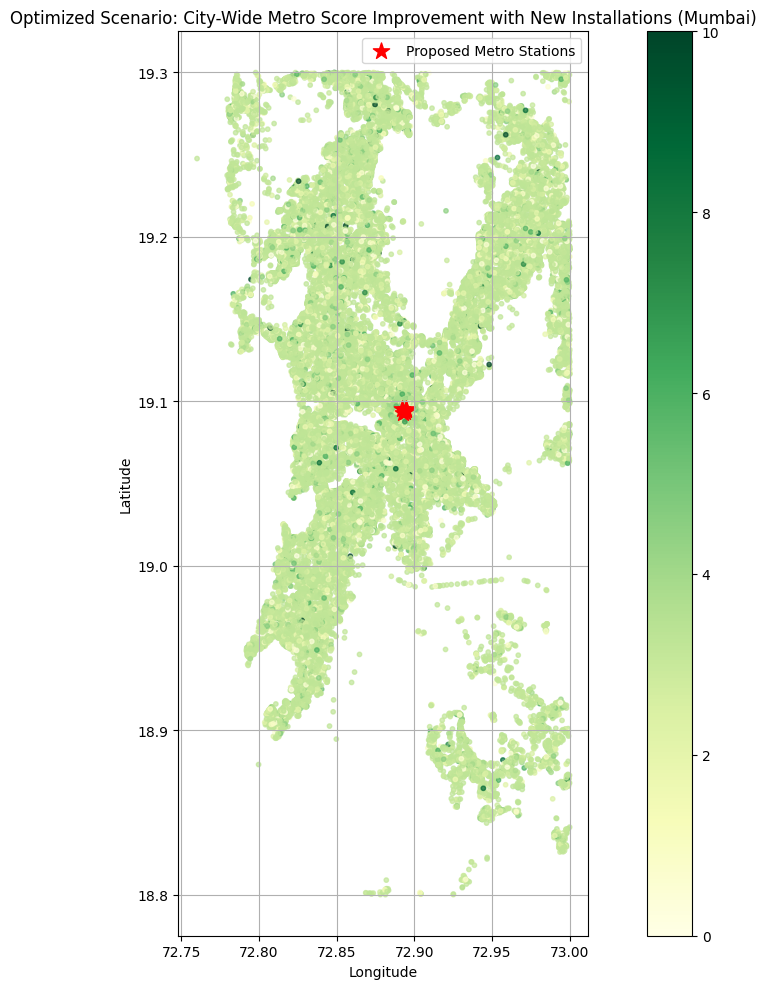

In [9]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import numpy as np
from geopy.distance import great_circle
from sklearn.neighbors import KernelDensity

# Reload Mumbai dataset
score_df = pd.read_csv("MumbaiScoreV1.csv")
residents_gdf = gpd.GeoDataFrame(
    score_df, 
    geometry=gpd.points_from_xy(score_df.longitude, score_df.latitude), 
    crs="EPSG:4326"
)

# Identify low-score Park_Score zones (proxy for poor Metro access)
threshold = residents_gdf['Park_Score'].quantile(0.1)
low_score_residents = residents_gdf[residents_gdf['Park_Score'] <= threshold].copy()

# Apply KDE to find high-density poor access zones
xy = np.vstack([low_score_residents.geometry.x, low_score_residents.geometry.y]).T
kde = KernelDensity(bandwidth=0.01, kernel='gaussian')
kde.fit(xy)
low_score_residents['density'] = kde.score_samples(xy)

# Select top 5 candidate points for new metro stations
top_locations = low_score_residents.sort_values(by='density', ascending=False).head(5)
new_metro_points = gpd.GeoDataFrame(geometry=top_locations.geometry, crs="EPSG:4326")

# Precompute resident and metro coordinates
res_coords = np.array([(pt.y, pt.x) for pt in residents_gdf.geometry])
new_metro_coords = np.array([(pt.y, pt.x) for pt in new_metro_points.geometry])

# Compute minimum great-circle distances from each residence to any proposed metro
def compute_min_distances(res_coords, facility_coords):
    min_distances = []
    for res in res_coords:
        dists = [great_circle(res, fac).km for fac in facility_coords]
        min_distances.append(min(dists))
    return np.array(min_distances)

# Calculate score improvements
min_dists = compute_min_distances(res_coords, new_metro_coords)
score_boost = np.clip((1 - min_dists / 1.2) * 1.5, 0, None)
residents_gdf['Metro_Score_Improved'] = np.clip(residents_gdf['Park_Score'] + score_boost, 0, 10)

# Plot results
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(
    ax=ax, 
    column='Metro_Score_Improved', 
    cmap='YlGn', 
    markersize=10, 
    legend=True, 
    alpha=0.7
)
new_metro_points.plot(
    ax=ax, 
    color='red', 
    marker='*', 
    markersize=150, 
    label='Proposed Metro Stations'
)

plt.title("Optimized Scenario: City-Wide Metro Score Improvement with New Installations (Mumbai)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


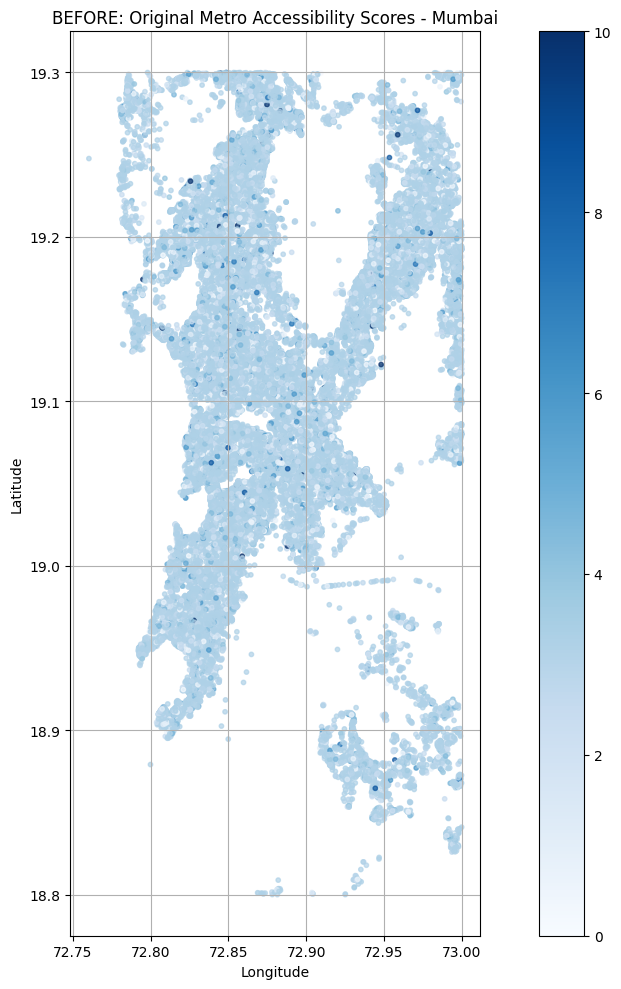

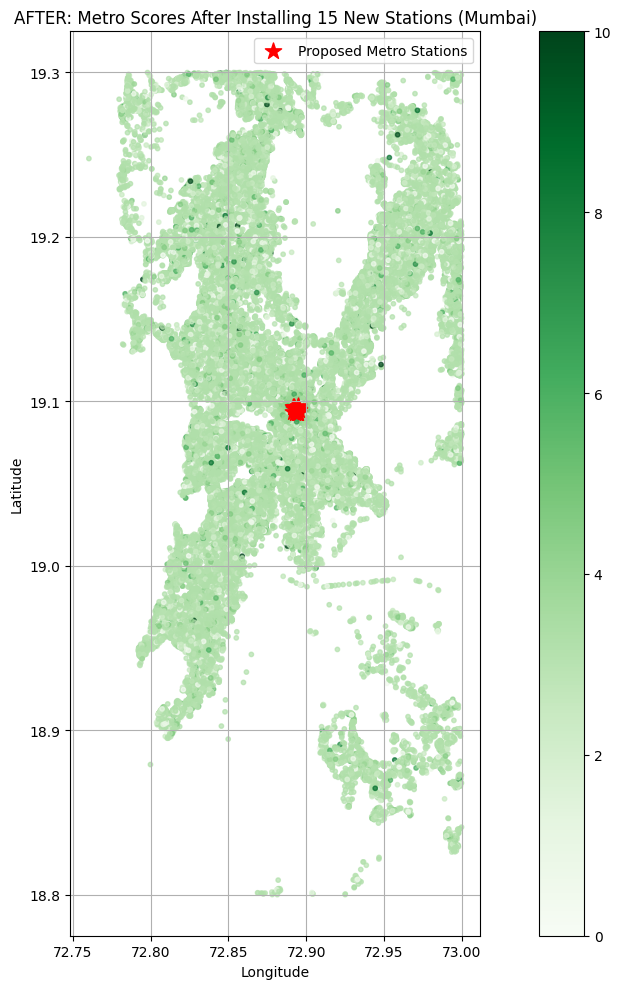

In [10]:
# Step 1: Select top 15 densest low-score areas
top15_locations = low_score_residents.sort_values('density', ascending=False).head(15)
top15_metro_points = gpd.GeoDataFrame(geometry=top15_locations.geometry, crs="EPSG:4326")
top15_metro_points['name'] = [f'Proposed Metro {i+1}' for i in range(len(top15_metro_points))]

# Step 2: Compute distances & score improvement
top15_coords = np.array([(pt.y, pt.x) for pt in top15_metro_points.geometry])
min_dists_15 = compute_min_distances(res_coords, top15_coords)

# Simulate boost using Park_Score as proxy for Metro_Score
residents_gdf['Metro_Score'] = residents_gdf['Park_Score']
score_boost_15 = np.clip((1 - min_dists_15 / 1.2) * 1.5, 0, None)
residents_gdf['Metro_Score_Improved_15'] = np.clip(residents_gdf['Metro_Score'] + score_boost_15, 0, 10)

# Step 3: Plot BEFORE (original metro scores)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score', cmap='Blues', markersize=10, legend=True, alpha=0.7)
plt.title("BEFORE: Original Metro Accessibility Scores - Mumbai")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 4: Plot AFTER (with 15 new stations)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Metro_Score_Improved_15', cmap='Greens', markersize=10, legend=True, alpha=0.7)
top15_metro_points.plot(ax=ax, color='red', marker='*', markersize=150, label='Proposed Metro Stations')

plt.title("AFTER: Metro Scores After Installing 15 New Stations (Mumbai)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


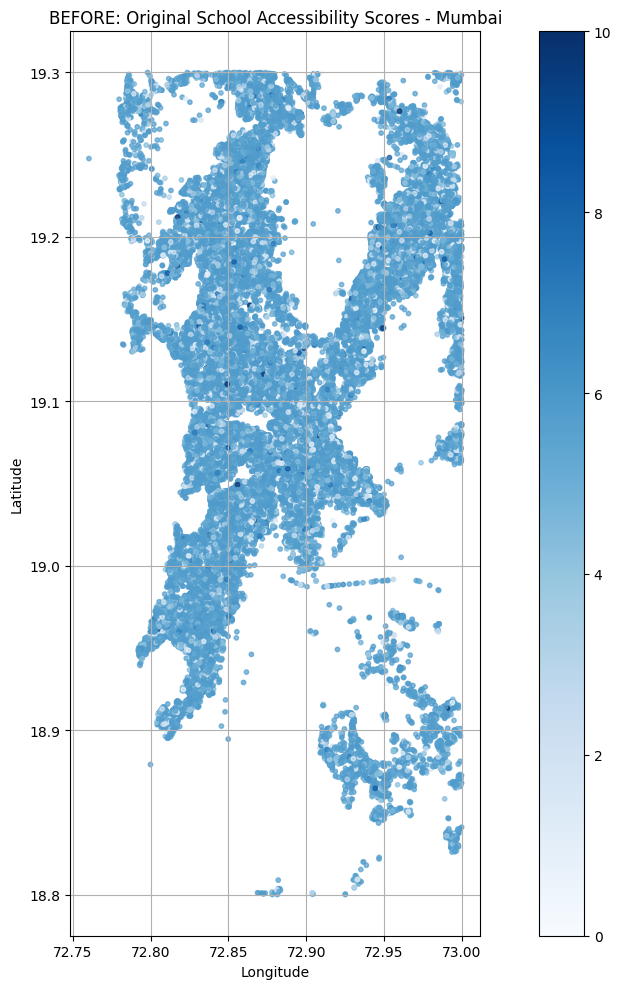

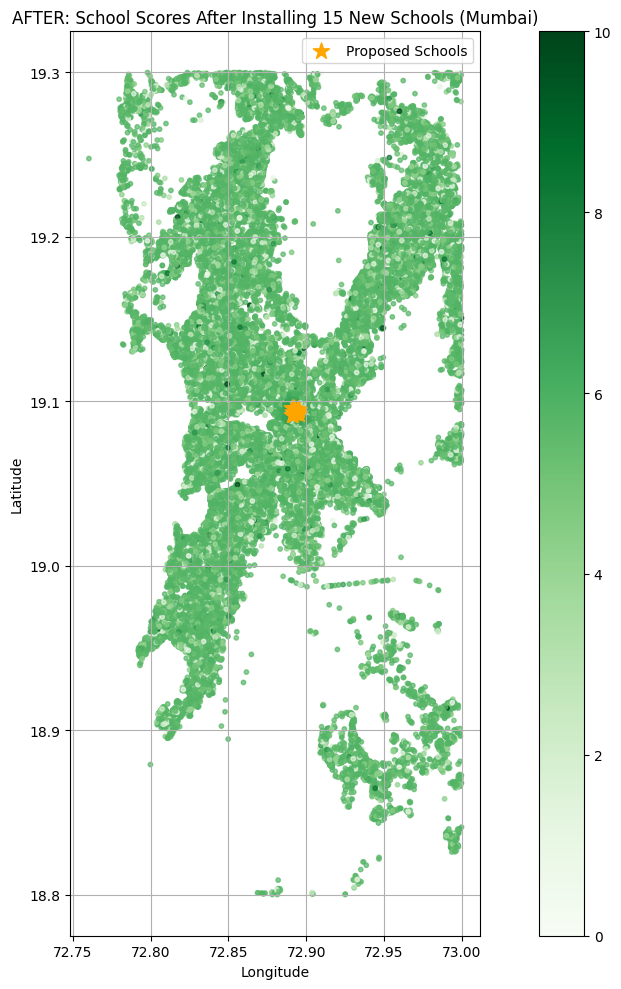

In [11]:
# Step 1: Configuration
target_column = 'School_Score'
boost_column = 'School_Score_Improved_15'
title_before = "BEFORE: Original School Accessibility Scores - Mumbai"
title_after = "AFTER: School Scores After Installing 15 New Schools (Mumbai)"

# Step 2: Identify bottom 10% in School Score
threshold_school = residents_gdf[target_column].quantile(0.1)
low_score_residents_school = residents_gdf[residents_gdf[target_column] <= threshold_school].copy()

# Step 3: KDE on low-score residences
xy_school = np.vstack([low_score_residents_school.geometry.x, low_score_residents_school.geometry.y]).T
kde_school = KernelDensity(bandwidth=0.01, metric='euclidean', kernel='gaussian')
kde_school.fit(xy_school)
densities_school = kde_school.score_samples(xy_school)
low_score_residents_school['density'] = densities_school

# Step 4: Select top 15 KDE hotspots for proposed schools
top15_school_locations = low_score_residents_school.sort_values('density', ascending=False).head(15)
top15_school_points = gpd.GeoDataFrame(geometry=top15_school_locations.geometry, crs="EPSG:4326")
top15_school_points['name'] = [f'Proposed School {i+1}' for i in range(len(top15_school_points))]

# Step 5: Compute distance-based boost
top15_school_coords = np.array([(pt.y, pt.x) for pt in top15_school_points.geometry])
min_dists_school = compute_min_distances(res_coords, top15_school_coords)
score_boost_school = np.clip((1 - min_dists_school / 1.2) * 1.5, 0, None)

# Step 6: Apply score improvement
residents_gdf[boost_column] = np.clip(residents_gdf[target_column] + score_boost_school, 0, 10)

# Step 7: Plot BEFORE (Original School Scores)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column=target_column, cmap='Blues', markersize=10, legend=True, alpha=0.7)
plt.title(title_before)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 8: Plot AFTER (Improved School Scores)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column=boost_column, cmap='Greens', markersize=10, legend=True, alpha=0.7)
top15_school_points.plot(ax=ax, color='orange', marker='*', markersize=150, label='Proposed Schools')

plt.title(title_after)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


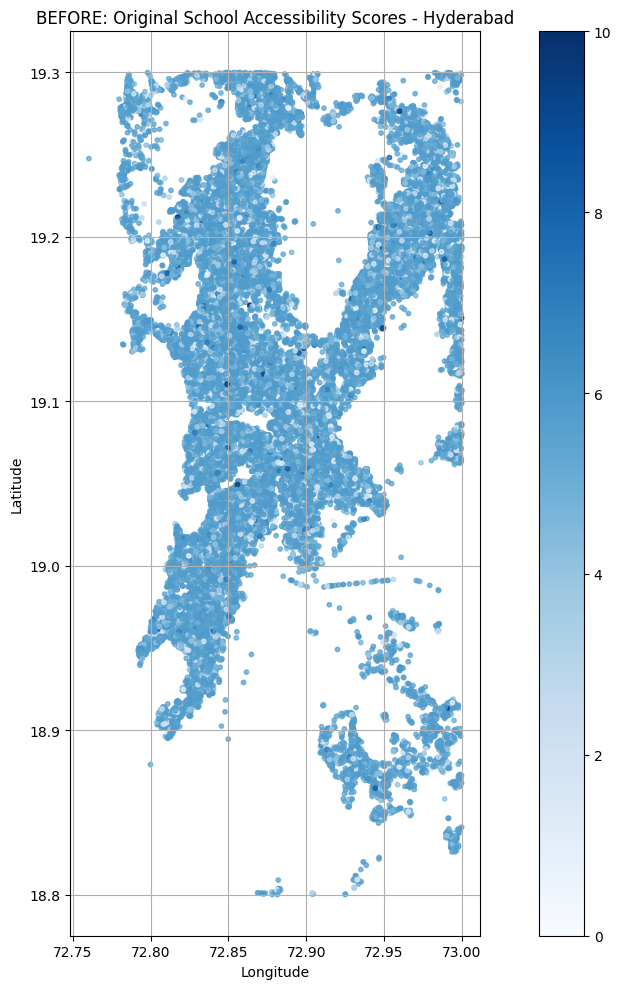

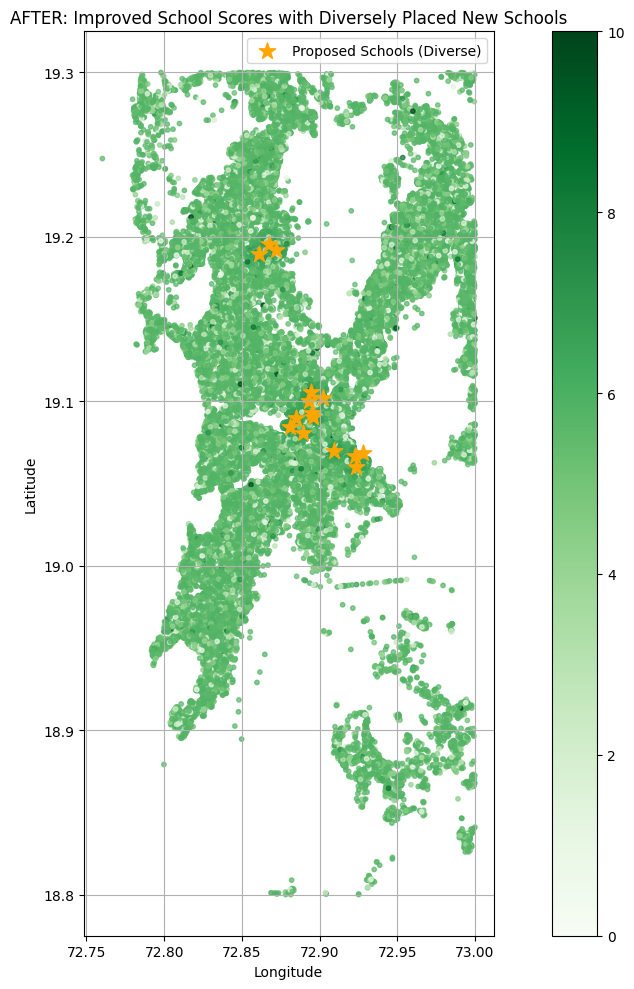

In [12]:
# Improve diversity of school placement using coordinate binning (~1.2km)
low_score_residents_school['lat_bin'] = low_score_residents_school.geometry.y.round(2)
low_score_residents_school['lon_bin'] = low_score_residents_school.geometry.x.round(2)

# Drop near-duplicate points in dense clusters
diverse_school_points = low_score_residents_school.drop_duplicates(subset=['lat_bin', 'lon_bin'])
top15_school_locations_diverse = diverse_school_points.sort_values('density', ascending=False).head(15)

# Convert selected points to GeoDataFrame
top15_school_points_diverse = gpd.GeoDataFrame(geometry=top15_school_locations_diverse.geometry, crs="EPSG:4326")
top15_school_points_diverse['name'] = [f'Proposed School {i+1}' for i in range(len(top15_school_points_diverse))]

# Compute school score improvement with spatially diverse placement
top15_school_coords_diverse = np.array([(pt.y, pt.x) for pt in top15_school_points_diverse.geometry])
min_dists_school_diverse = compute_min_distances(res_coords, top15_school_coords_diverse)
score_boost_school_diverse = np.clip((1 - min_dists_school_diverse / 1.2) * 1.5, 0, None)
improved_scores_school_diverse = np.clip(residents_gdf['School_Score'] + score_boost_school_diverse, 0, 10)

# Update DataFrame
residents_gdf['School_Score_Improved_15_Diverse'] = improved_scores_school_diverse

# Plot BEFORE (original school scores)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='School_Score', cmap='Blues', markersize=10, legend=True, alpha=0.7)
plt.title("BEFORE: Original School Accessibility Scores - Hyderabad")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot AFTER with diverse school placements
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='School_Score_Improved_15_Diverse', cmap='Greens', markersize=10, legend=True, alpha=0.7)
top15_school_points_diverse.plot(ax=ax, color='orange', marker='*', markersize=150, label='Proposed Schools (Diverse)')

plt.title("AFTER: Improved School Scores with Diversely Placed New Schools")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


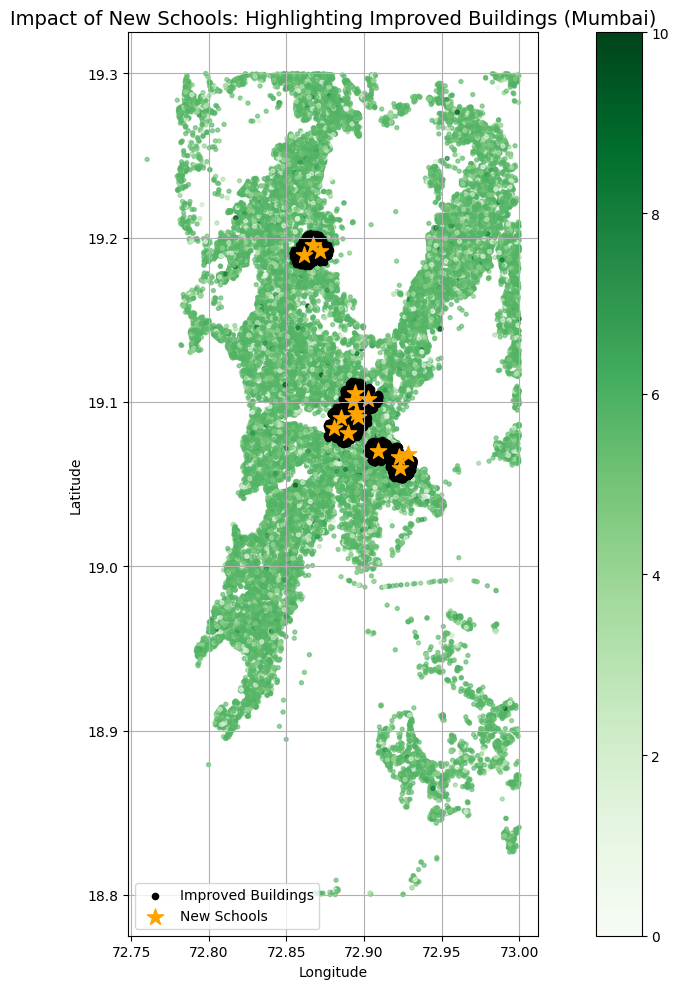

In [13]:
from geopy.distance import geodesic

# Step 1: Set improvement threshold and distance proximity
threshold_km = 1.2
improved_mask = score_boost_school_diverse > 0.5  # Residents that received > 0.5 score boost

# Step 2: Proximity check - is a building within 1.2km of any proposed diverse school?
def is_near_any_school(row, school_points, threshold_km=1.2):
    return any(
        geodesic((row.geometry.y, row.geometry.x), (pt.y, pt.x)).km < threshold_km
        for pt in school_points.geometry
    )

# Step 3: Apply the check across the GeoDataFrame
residents_gdf['Near_New_School'] = residents_gdf.apply(
    lambda row: is_near_any_school(row, top15_school_points_diverse, threshold_km), axis=1
)

# Step 4: Select buildings that improved and are close to new schools
highlight_residents = residents_gdf[improved_mask & residents_gdf['Near_New_School']]

# Step 5: Plot results
fig, ax = plt.subplots(figsize=(12, 10))

# Background: full residents colored by improved score
residents_gdf.plot(
    ax=ax, 
    column='School_Score_Improved_15_Diverse', 
    cmap='Greens', 
    markersize=8, 
    alpha=0.6, 
    legend=True
)

# Highlight: residents that improved significantly and are near new schools
highlight_residents.plot(
    ax=ax, 
    color='black', 
    marker='o', 
    markersize=20, 
    label='Improved Buildings'
)

# Mark: locations of new schools
top15_school_points_diverse.plot(
    ax=ax, 
    color='orange', 
    marker='*', 
    markersize=150, 
    label='New Schools'
)

plt.title("Impact of New Schools: Highlighting Improved Buildings (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


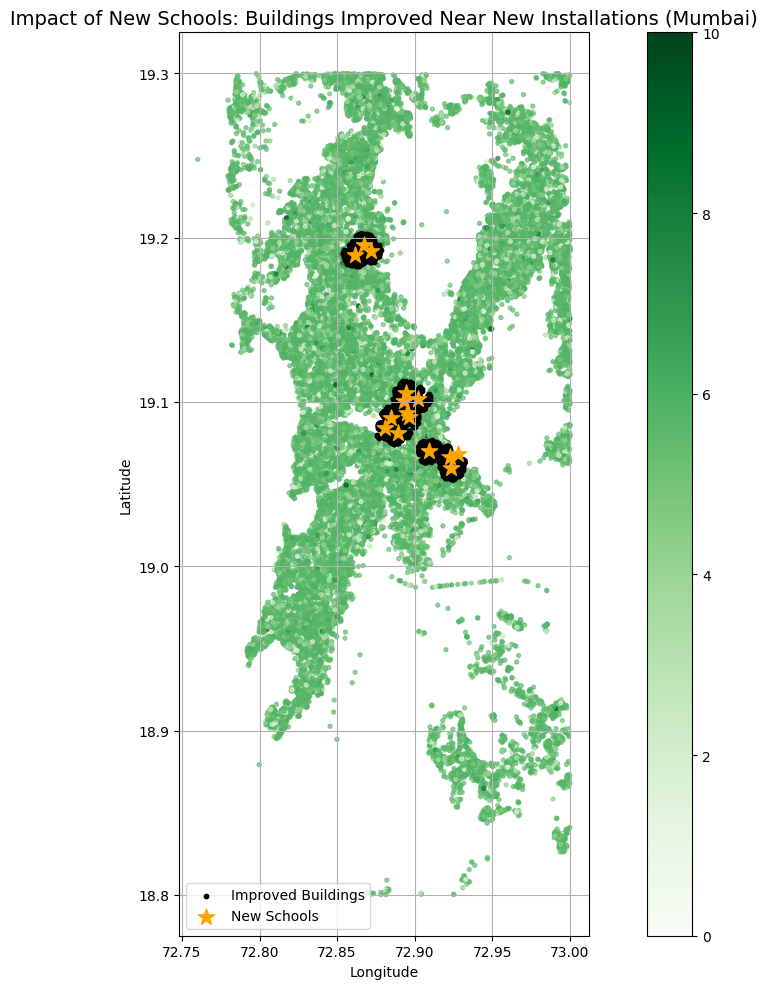

In [14]:
from geopy.distance import great_circle
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Extract coordinates
school_coords = np.array([(pt.y, pt.x) for pt in top15_school_points_diverse.geometry])

# Step 2: Efficient proximity mask using great-circle distance
def compute_nearby_flags(res_coords, facility_coords, threshold_km):
    return np.array([
        min(great_circle(res, fac).km for fac in facility_coords) < threshold_km
        for res in res_coords
    ])

# Step 3: Apply proximity + boost threshold filters
near_school_flags = compute_nearby_flags(res_coords, school_coords, threshold_km=1.2)
score_improved_flags = score_boost_school_diverse > 0.5
highlight_mask = near_school_flags & score_improved_flags

# Step 4: Select highlighted buildings
highlighted_residents = residents_gdf[highlight_mask]

# Step 5: Plot map
fig, ax = plt.subplots(figsize=(12, 10))

# Base: all buildings with their improved school score
residents_gdf.plot(
    ax=ax, 
    column='School_Score_Improved_15_Diverse', 
    cmap='Greens', 
    markersize=8, 
    alpha=0.6, 
    legend=True
)

# Highlight: buildings that benefited most
highlighted_residents.plot(
    ax=ax, 
    color='black', 
    marker='o', 
    markersize=10, 
    label='Improved Buildings'
)

# Locations of newly proposed diverse schools
top15_school_points_diverse.plot(
    ax=ax, 
    color='orange', 
    marker='*', 
    markersize=150, 
    label='New Schools'
)

# Final touches
plt.title("Impact of New Schools: Buildings Improved Near New Installations (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


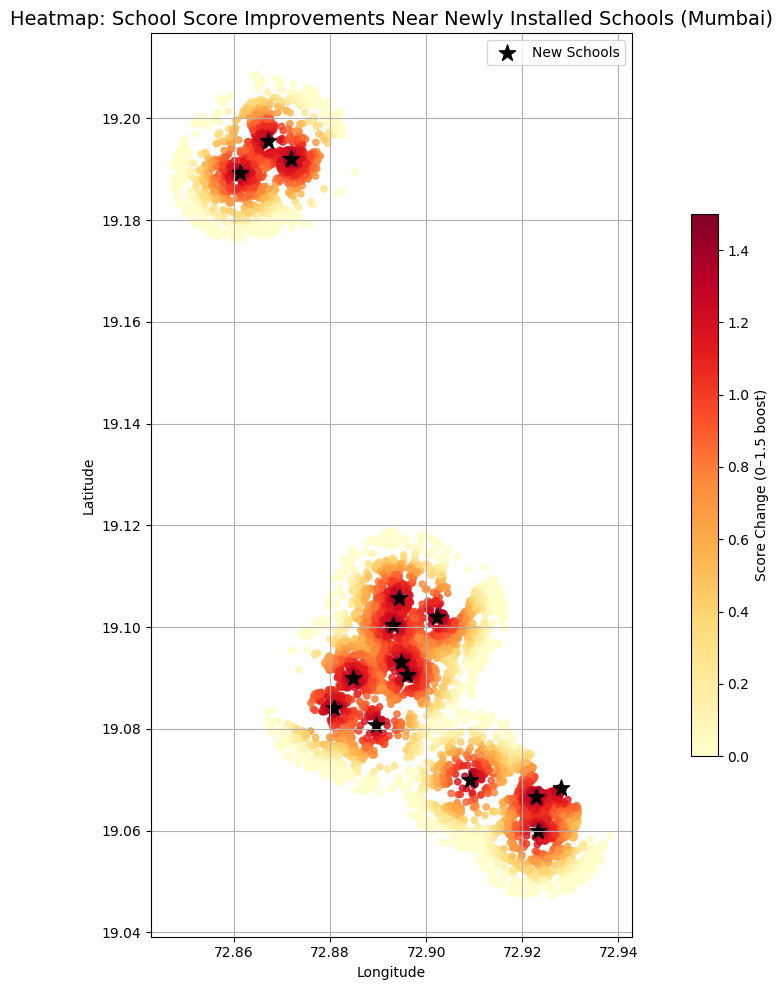

In [15]:
from geopy.distance import great_circle
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Filter residents within 1.5 km of any new school
def compute_heatmap_subset(res_coords, facility_coords, radius_km=1.5):
    return np.array([
        min(great_circle(res, fac).km for fac in facility_coords) < radius_km
        for res in res_coords
    ])

heatmap_mask = compute_heatmap_subset(res_coords, school_coords, radius_km=1.5)
heatmap_residents = residents_gdf[heatmap_mask].copy()

# Step 2: Calculate score change due to new school influence
heatmap_residents['Score_Change'] = (
    heatmap_residents['School_Score_Improved_15_Diverse'] - heatmap_residents['School_Score']
)

# Step 3: Plot the heatmap
fig, ax = plt.subplots(figsize=(12, 10))
heatmap_residents.plot(
    ax=ax,
    column='Score_Change',
    cmap='YlOrRd',
    markersize=20,
    alpha=0.8,
    legend=True,
    legend_kwds={'label': "Score Change (0–1.5 boost)", 'shrink': 0.6}
)

# Mark new school locations
top15_school_points_diverse.plot(
    ax=ax,
    color='black',
    marker='*',
    markersize=150,
    label='New Schools'
)

# Final formatting
plt.title("Heatmap: School Score Improvements Near Newly Installed Schools (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


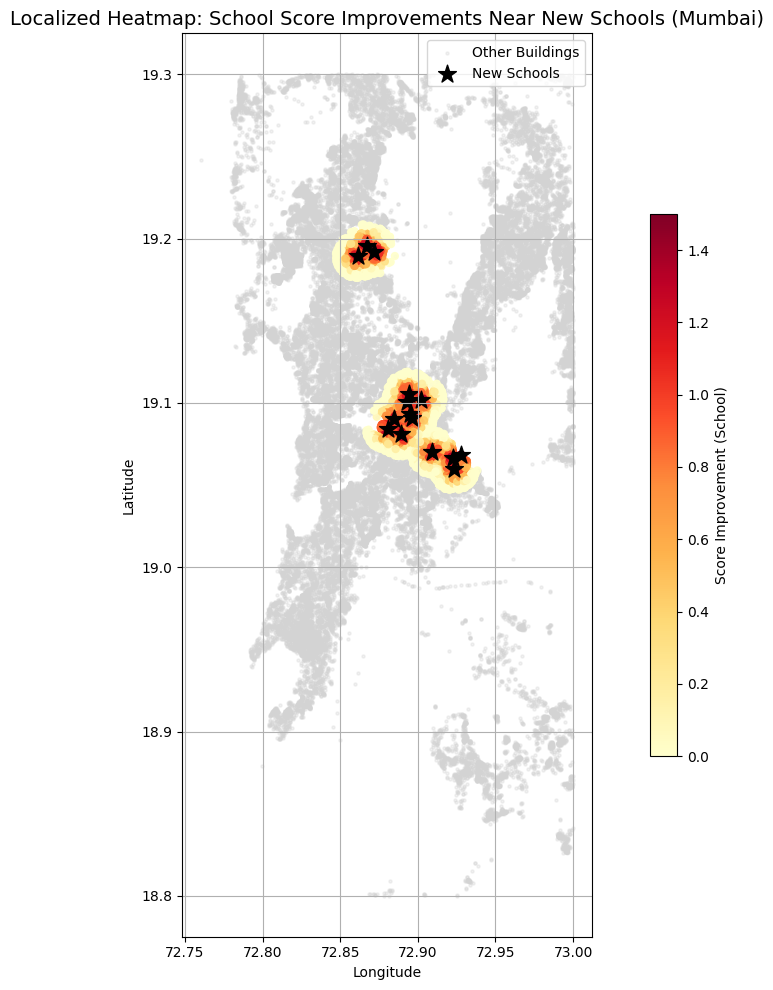

In [16]:
fig, ax = plt.subplots(figsize=(12, 10))

# Background: Plot all buildings faintly
residents_gdf.plot(
    ax=ax,
    color='lightgray',
    markersize=5,
    alpha=0.3,
    label='Other Buildings'
)

# Foreground: Buildings within 1.5km showing score change
heatmap_plot = heatmap_residents.plot(
    ax=ax,
    column='Score_Change',
    cmap='YlOrRd',
    markersize=25,
    alpha=0.9,
    legend=True,
    legend_kwds={'label': 'Score Improvement (School)', 'shrink': 0.6}
)

# Overlay: Proposed school locations
top15_school_points_diverse.plot(
    ax=ax,
    color='black',
    marker='*',
    markersize=180,
    label='New Schools'
)

# Titles and labels
plt.title("Localized Heatmap: School Score Improvements Near New Schools (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()


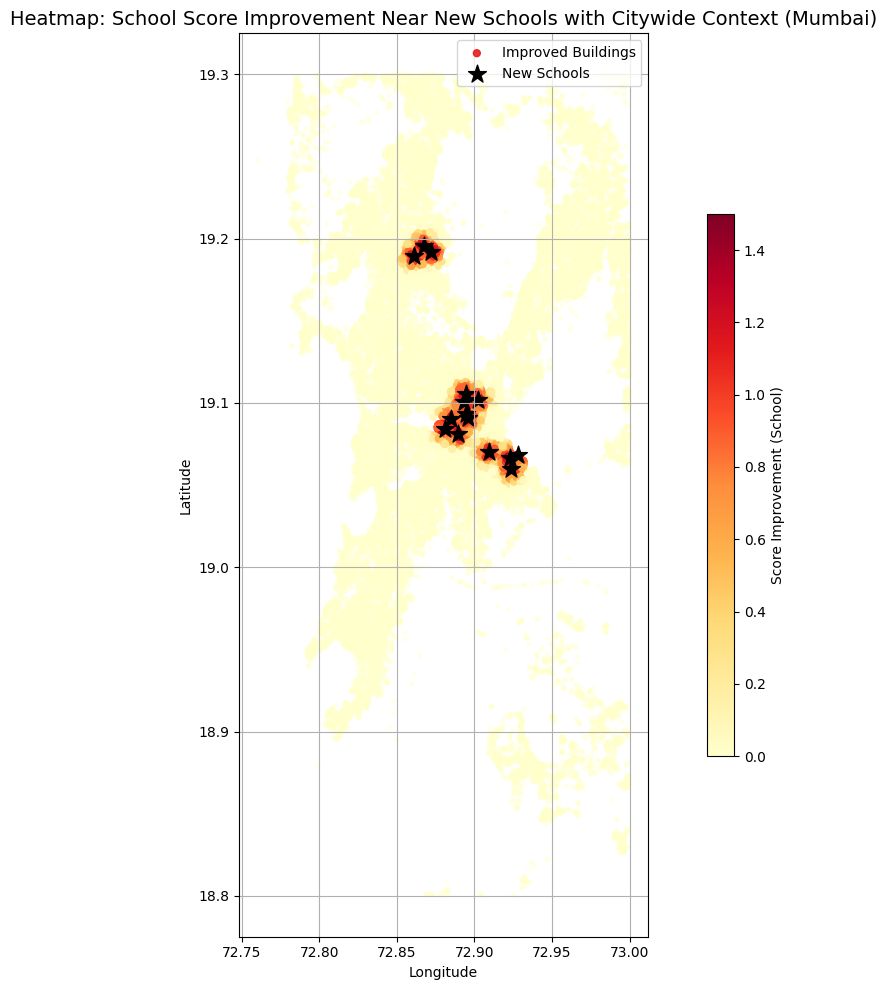

In [17]:
fig, ax = plt.subplots(figsize=(12, 10))

# Step 1: Citywide score improvement (light base layer)
score_change_all = residents_gdf['School_Score_Improved_15_Diverse'] - residents_gdf['School_Score']
residents_gdf.plot(
    ax=ax,
    column=score_change_all,
    cmap='YlOrRd',
    markersize=8,
    alpha=0.3,
    legend=False
)

# Step 2: Highlight residents near new schools with bold color
heatmap_residents.plot(
    ax=ax,
    column='Score_Change',
    cmap='YlOrRd',
    markersize=25,
    alpha=0.9,
    legend=True,
    label='Improved Buildings',
    legend_kwds={'label': 'Score Improvement (School)', 'shrink': 0.6}
)

# Step 3: Overlay new school locations
top15_school_points_diverse.plot(
    ax=ax,
    color='black',
    marker='*',
    markersize=180,
    label='New Schools'
)

# Final formatting
plt.title("Heatmap: School Score Improvement Near New Schools with Citywide Context (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()


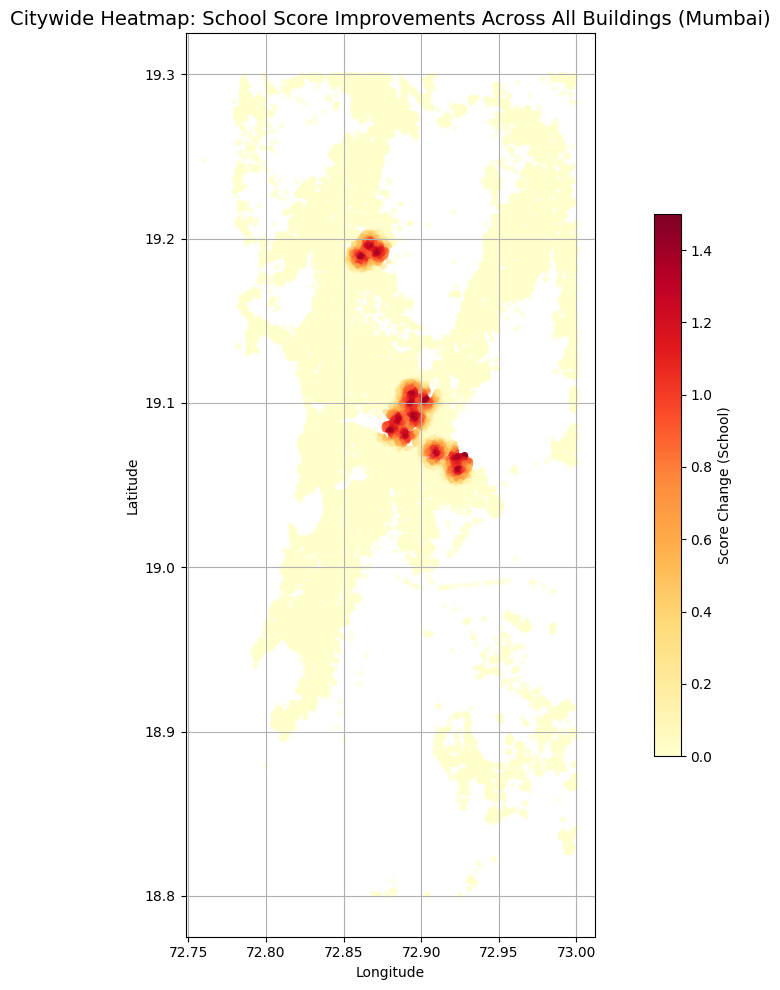

In [18]:
# Step 1: Compute school score delta citywide
residents_gdf['Score_Change_Citywide'] = (
    residents_gdf['School_Score_Improved_15_Diverse'] - residents_gdf['School_Score']
)

# Step 2: Plot full city heatmap
fig, ax = plt.subplots(figsize=(12, 10))

residents_gdf.plot(
    ax=ax,
    column='Score_Change_Citywide',
    cmap='YlOrRd',
    markersize=10,
    alpha=0.4,
    legend=True,
    legend_kwds={
        'label': "Score Change (School)",
        'shrink': 0.6,
        'orientation': 'vertical'
    }
)

# Plot formatting
plt.title("Citywide Heatmap: School Score Improvements Across All Buildings (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.tight_layout()
plt.show()


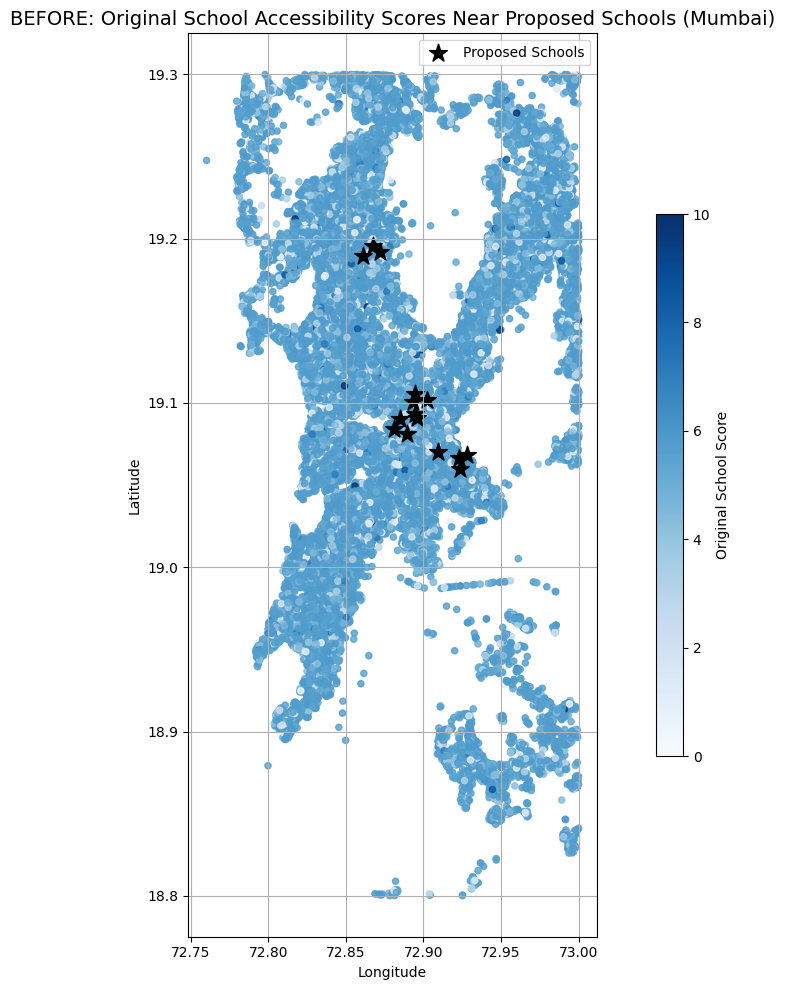

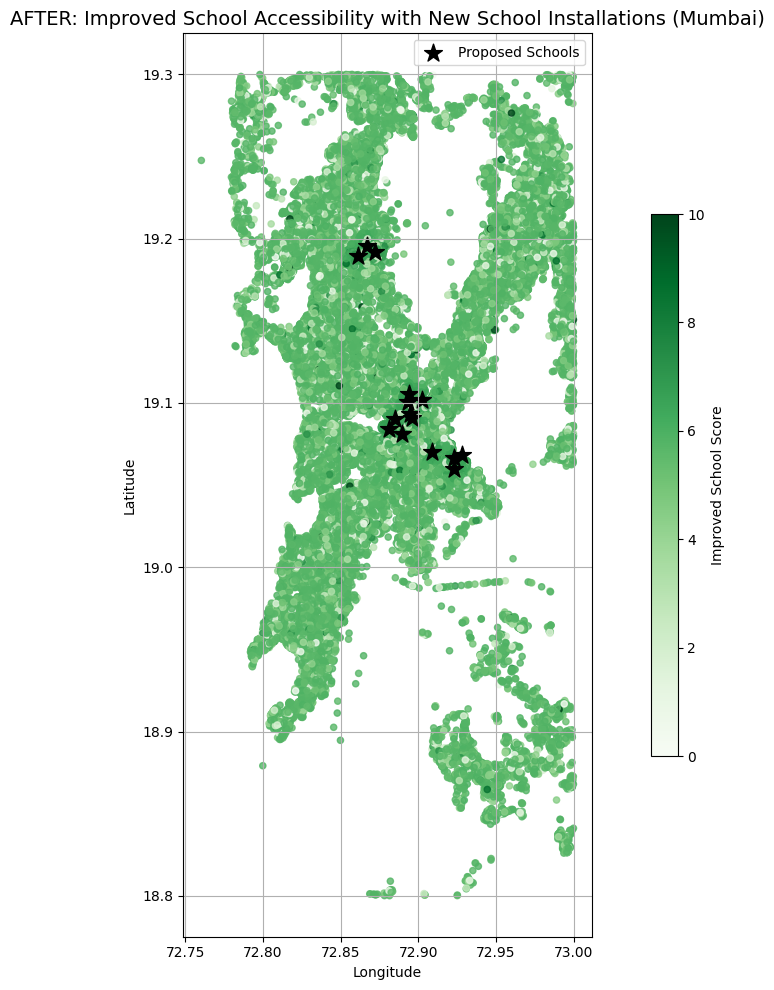

In [19]:
# --- BEFORE: Original School Accessibility Scores Near Proposed Schools ---
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(
    ax=ax,
    column='School_Score',
    cmap='Blues',
    markersize=20,
    alpha=0.8,
    legend=True,
    legend_kwds={'label': 'Original School Score', 'shrink': 0.6}
)
top15_school_points_diverse.plot(
    ax=ax,
    color='black',
    marker='*',
    markersize=180,
    label='Proposed Schools'
)

plt.title("BEFORE: Original School Accessibility Scores Near Proposed Schools (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()

# --- AFTER: Improved School Accessibility Scores Post Simulation ---
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(
    ax=ax,
    column='School_Score_Improved_15_Diverse',
    cmap='Greens',
    markersize=20,
    alpha=0.8,
    legend=True,
    legend_kwds={'label': 'Improved School Score', 'shrink': 0.6}
)
top15_school_points_diverse.plot(
    ax=ax,
    color='black',
    marker='*',
    markersize=180,
    label='Proposed Schools'
)

plt.title("AFTER: Improved School Accessibility with New School Installations (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()


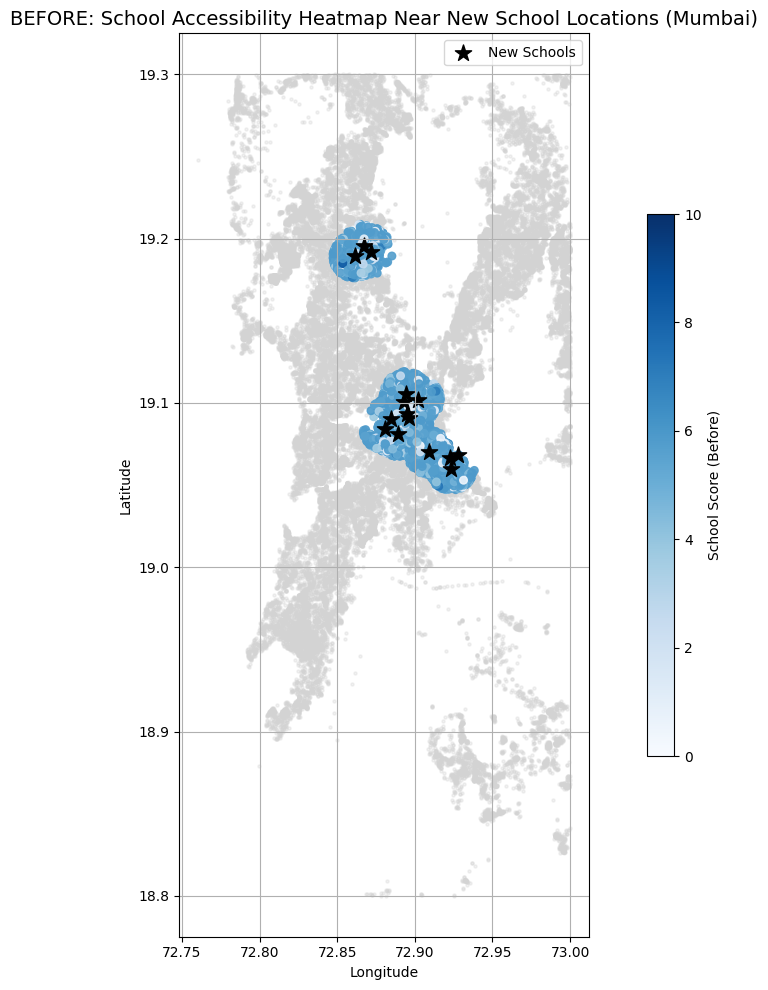

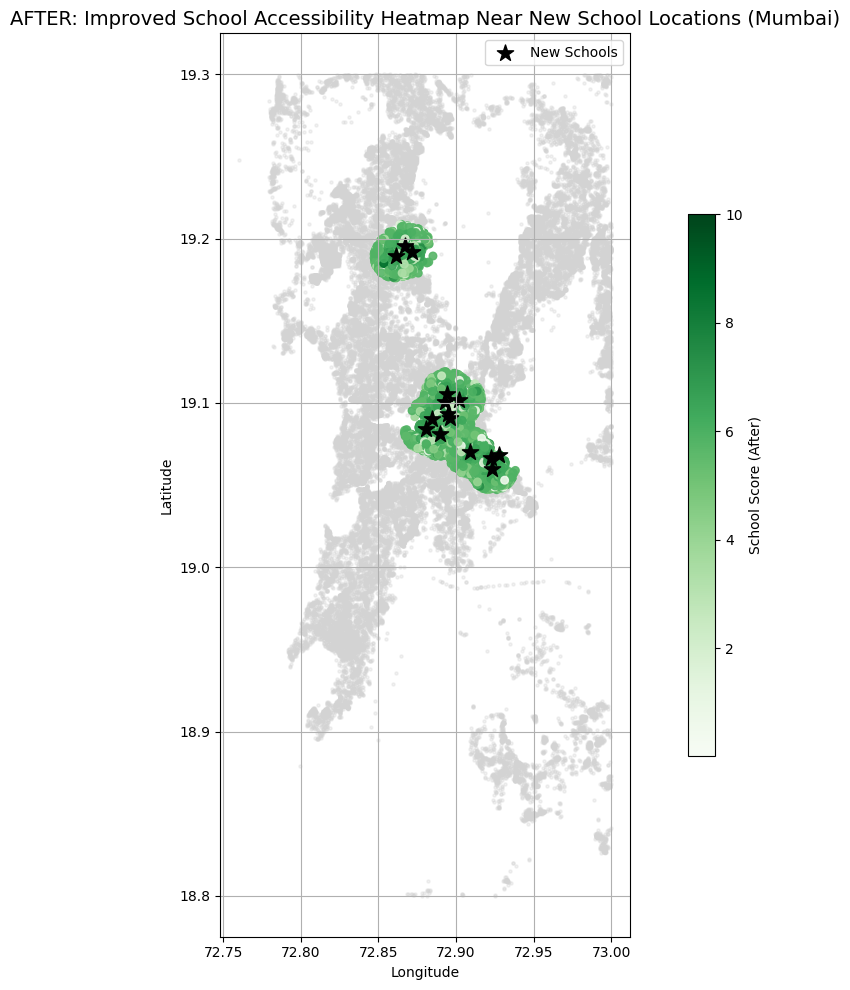

In [20]:
# Step 1: Subset residents within 1.5 km of any new school
heatmap_mask = compute_heatmap_subset(res_coords, school_coords, radius_km=1.5)

# Prepare before and after views
heatmap_before = residents_gdf[heatmap_mask].copy()
heatmap_before['Score'] = heatmap_before['School_Score']

heatmap_after = residents_gdf[heatmap_mask].copy()
heatmap_after['Score'] = heatmap_after['School_Score_Improved_15_Diverse']

# ---------- BEFORE HEATMAP ----------
fig, ax = plt.subplots(figsize=(12, 10))

# Base: All buildings faint
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3)

# Foreground: Focused score before improvements
heatmap_before.plot(
    ax=ax,
    column='Score',
    cmap='Blues',
    markersize=30,
    alpha=0.9,
    legend=True,
    legend_kwds={'label': 'School Score (Before)', 'shrink': 0.6}
)

# Proposed school markers
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=150, label='New Schools')

# Titles and formatting
plt.title("BEFORE: School Accessibility Heatmap Near New School Locations (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()


# ---------- AFTER HEATMAP ----------
fig, ax = plt.subplots(figsize=(12, 10))

# Base: All buildings faint
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3)

# Foreground: Focused score after improvements
heatmap_after.plot(
    ax=ax,
    column='Score',
    cmap='Greens',
    markersize=30,
    alpha=0.9,
    legend=True,
    legend_kwds={'label': 'School Score (After)', 'shrink': 0.6}
)

# Proposed school markers
top15_school_points_diverse.plot(ax=ax, color='black', marker='*', markersize=150, label='New Schools')

# Titles and formatting
plt.title("AFTER: Improved School Accessibility Heatmap Near New School Locations (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()


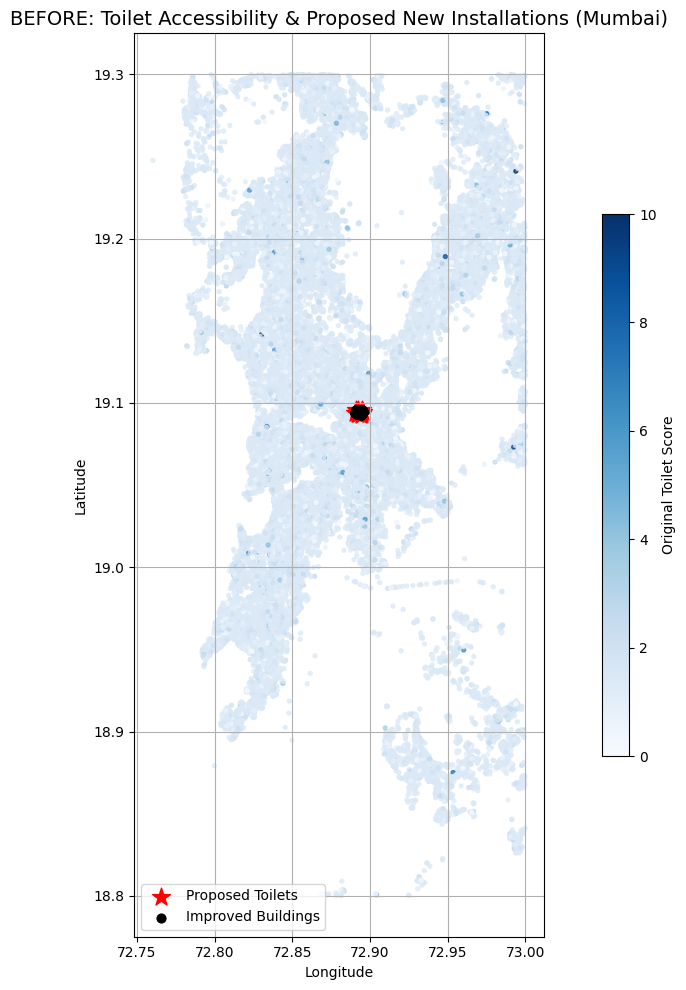

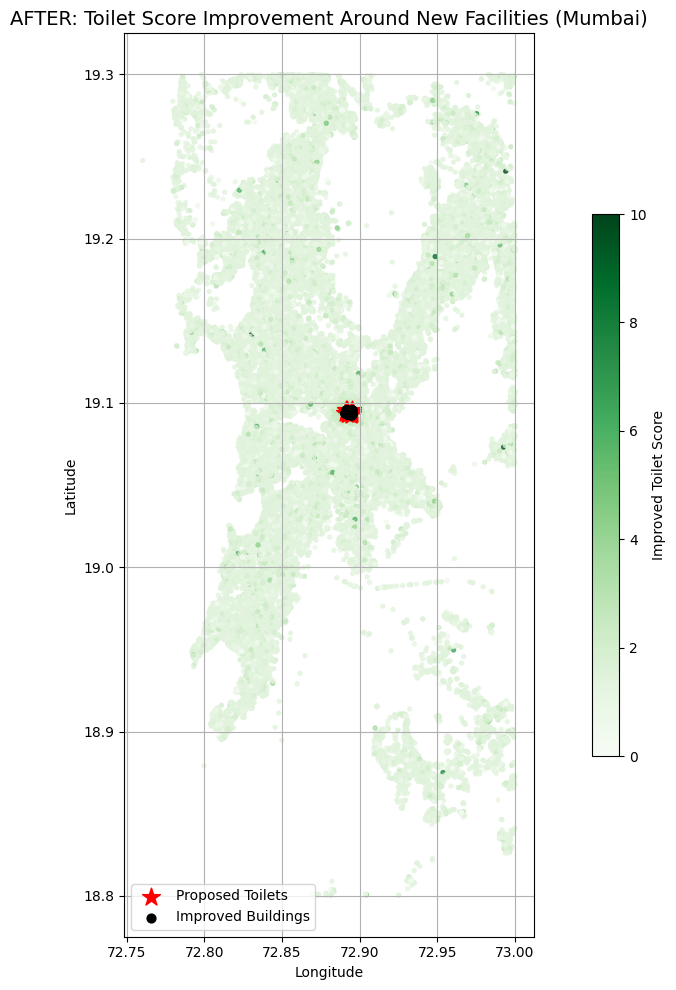

In [21]:
from geopy.distance import geodesic
import pandas as pd
import numpy as np
from sklearn.neighbors import KernelDensity
import matplotlib.pyplot as plt

# Step 1: Identify bottom 10% in Toilet Score
threshold_toilet = residents_gdf['Toilet_Score'].quantile(0.1)
low_score_residents_toilet = residents_gdf[residents_gdf['Toilet_Score'] <= threshold_toilet].copy()

# KDE to find spatial density clusters
xy_toilet = np.vstack([low_score_residents_toilet.geometry.x, low_score_residents_toilet.geometry.y]).T
kde_toilet = KernelDensity(bandwidth=0.01, metric='euclidean', kernel='gaussian')
kde_toilet.fit(xy_toilet)
densities_toilet = kde_toilet.score_samples(xy_toilet)
low_score_residents_toilet['density'] = densities_toilet

# Step 2: Select 12 diverse high-density toilet installation points
top_toilet_points = low_score_residents_toilet.drop_duplicates(
    subset=['geometry'], keep='first'
).sort_values('density', ascending=False).head(12)

new_toilet_points = gpd.GeoDataFrame(geometry=top_toilet_points.geometry, crs="EPSG:4326")
new_toilet_coords = np.array([(pt.y, pt.x) for pt in new_toilet_points.geometry])

# Step 3: Compute distance-based toilet score improvements
min_dists_toilets = compute_min_distances(res_coords, new_toilet_coords)
score_boost_toilets = np.clip((1 - min_dists_toilets / 1.2) * 1.5, 0, None)
residents_gdf['Toilet_Score_Improved'] = np.clip(residents_gdf['Toilet_Score'] + score_boost_toilets, 0, 10)

# Step 4: Highlight top 5 improved buildings per toilet point
highlighted_groups = []
for point in new_toilet_points.geometry:
    distances = residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km)
    nearby = residents_gdf[distances < 1.2].copy()
    nearby['score_diff'] = nearby['Toilet_Score_Improved'] - nearby['Toilet_Score']
    top5 = nearby.sort_values('score_diff', ascending=False).head(5)
    highlighted_groups.append(top5)

highlighted_buildings = pd.concat(highlighted_groups)

# Step 5: Plot BEFORE (Original Toilet Score)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Toilet_Score', cmap='Blues', markersize=8, alpha=0.7, legend=True,
                   legend_kwds={'label': 'Original Toilet Score', 'shrink': 0.6})
new_toilet_points.plot(ax=ax, color='red', marker='*', markersize=180, label='Proposed Toilets')
highlighted_buildings.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Toilet Accessibility & Proposed New Installations (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 6: Plot AFTER (Improved Toilet Score)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(ax=ax, column='Toilet_Score_Improved', cmap='Greens', markersize=8, alpha=0.7, legend=True,
                   legend_kwds={'label': 'Improved Toilet Score', 'shrink': 0.6})
new_toilet_points.plot(ax=ax, color='red', marker='*', markersize=180, label='Proposed Toilets')
highlighted_buildings.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Toilet Score Improvement Around New Facilities (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


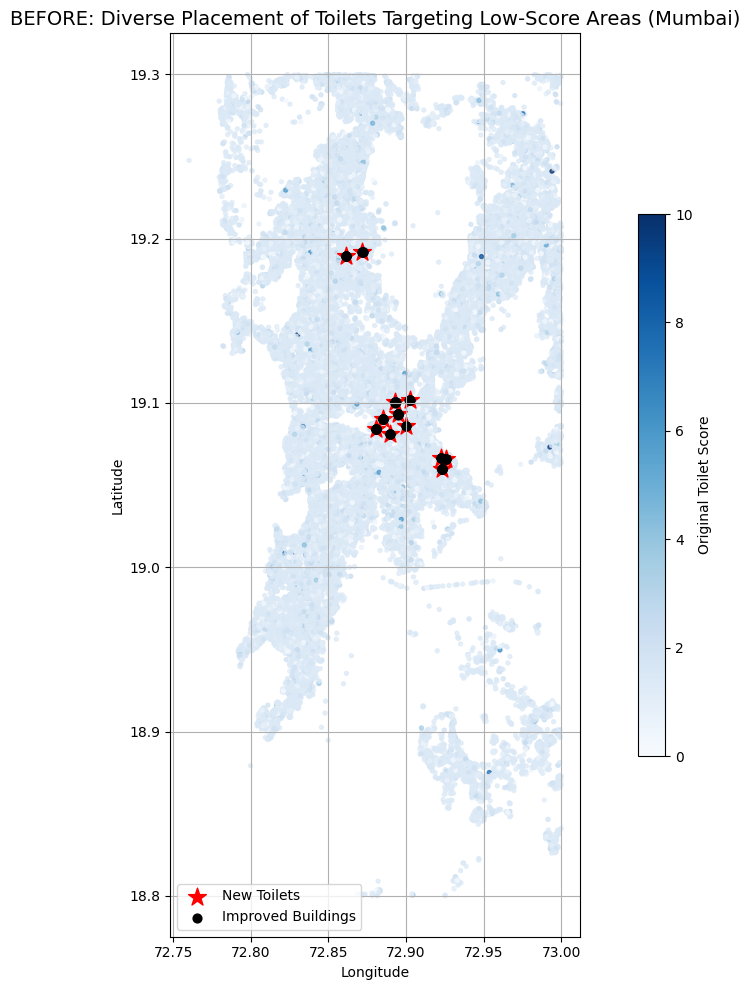

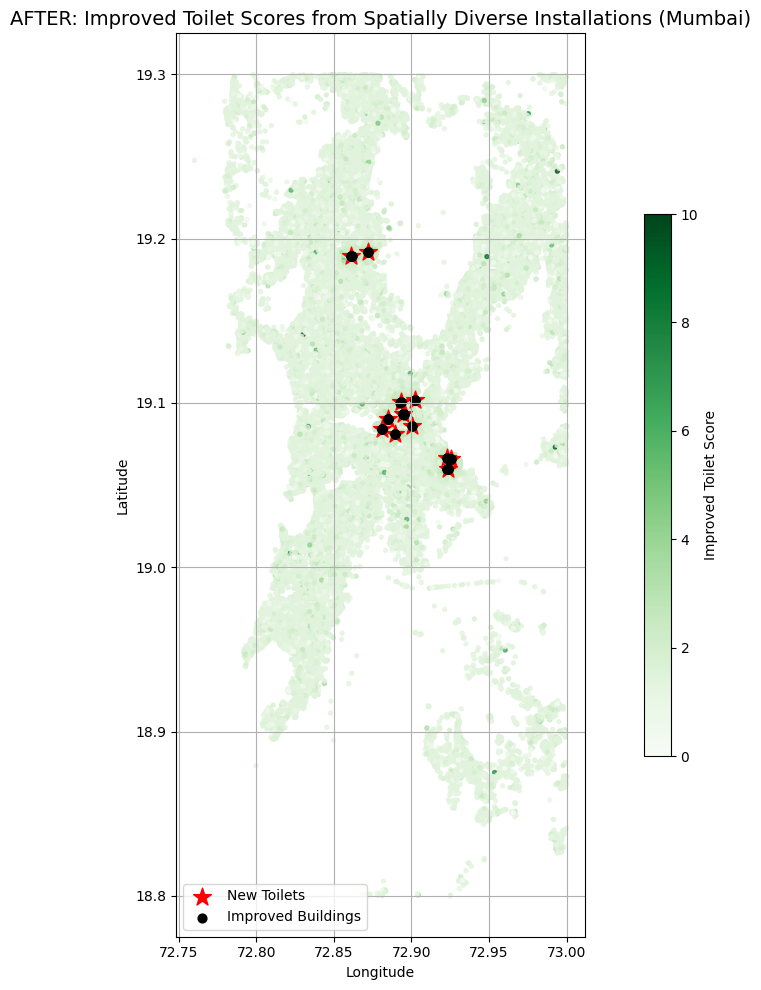

In [22]:
# Step 1: Add lat/lon bins to enforce spatial spread (~1.2 km)
low_score_residents_toilet['lat_bin'] = low_score_residents_toilet.geometry.y.round(2)
low_score_residents_toilet['lon_bin'] = low_score_residents_toilet.geometry.x.round(2)

# Step 2: Remove near-duplicate points across bins and select top 12
diverse_toilet_points = low_score_residents_toilet.drop_duplicates(subset=['lat_bin', 'lon_bin'])
top_diverse_toilet_locations = diverse_toilet_points.sort_values('density', ascending=False).head(12)

# Step 3: Create GeoDataFrame for proposed diverse toilet locations
new_toilet_points_diverse = gpd.GeoDataFrame(geometry=top_diverse_toilet_locations.geometry, crs="EPSG:4326")
new_toilet_coords_diverse = np.array([(pt.y, pt.x) for pt in new_toilet_points_diverse.geometry])

# Step 4: Recalculate distance-based toilet score improvements
min_dists_toilets_diverse = compute_min_distances(res_coords, new_toilet_coords_diverse)
score_boost_toilets_diverse = np.clip((1 - min_dists_toilets_diverse / 1.2) * 1.5, 0, None)
residents_gdf['Toilet_Score_Improved_Diverse'] = np.clip(
    residents_gdf['Toilet_Score'] + score_boost_toilets_diverse, 0, 10
)

# Step 5: Highlight top 5 improved buildings near each proposed toilet location
highlighted_groups_diverse = []
for point in new_toilet_points_diverse.geometry:
    distances = residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km)
    nearby = residents_gdf[distances < 1.2].copy()
    nearby['score_diff'] = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']
    top5 = nearby.sort_values('score_diff', ascending=False).head(5)
    highlighted_groups_diverse.append(top5)

highlighted_buildings_diverse = pd.concat(highlighted_groups_diverse)

# Step 6: Plot BEFORE (Toilet Accessibility Baseline)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(
    ax=ax,
    column='Toilet_Score',
    cmap='Blues',
    markersize=8,
    alpha=0.7,
    legend=True,
    legend_kwds={'label': 'Original Toilet Score', 'shrink': 0.6}
)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("BEFORE: Diverse Placement of Toilets Targeting Low-Score Areas (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 7: Plot AFTER (Toilet Score Improvements)
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(
    ax=ax,
    column='Toilet_Score_Improved_Diverse',
    cmap='Greens',
    markersize=8,
    alpha=0.7,
    legend=True,
    legend_kwds={'label': 'Improved Toilet Score', 'shrink': 0.6}
)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')
plt.title("AFTER: Improved Toilet Scores from Spatially Diverse Installations (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


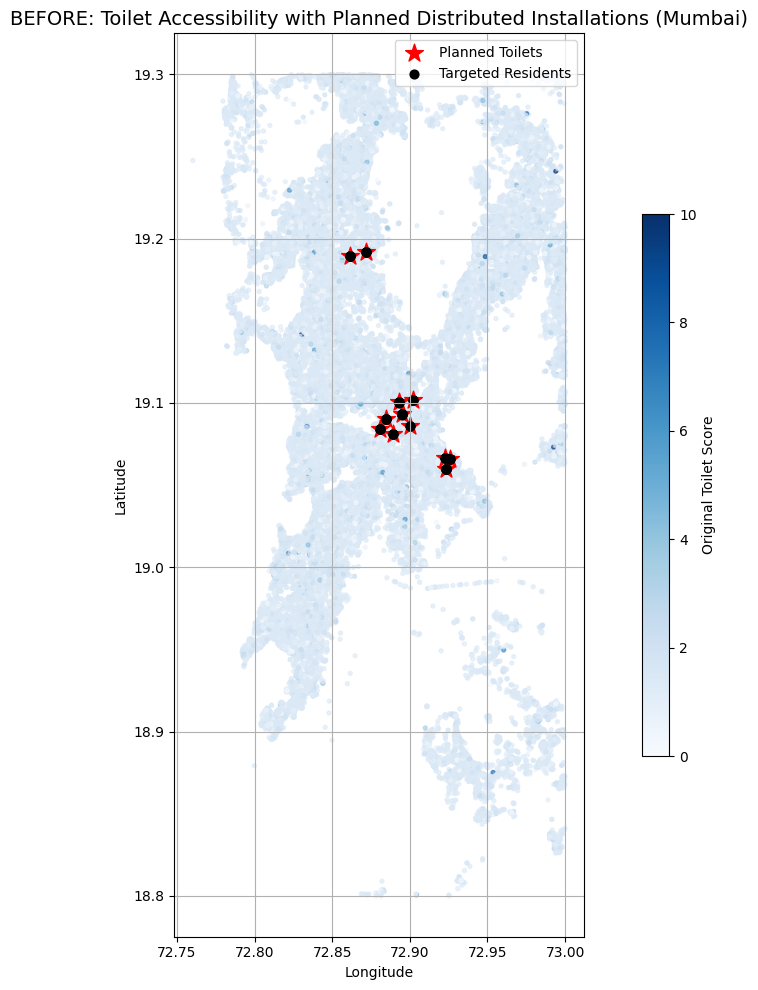

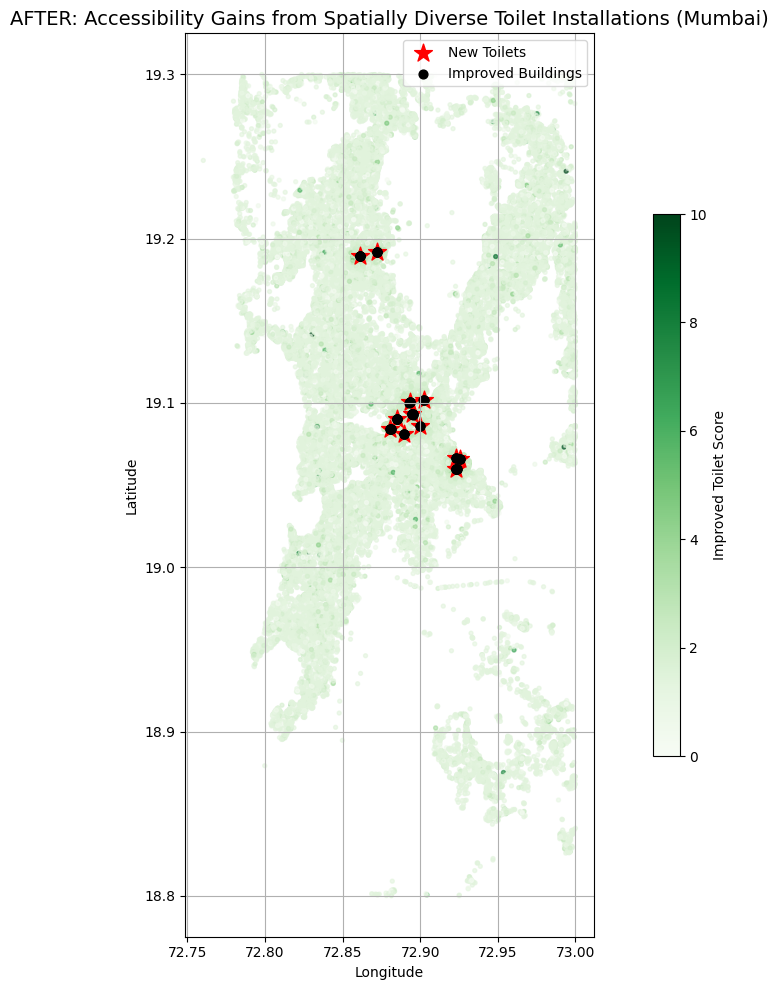

In [23]:
# --- Step 0: Ensure rebuilt dataframe is fresh ---
highlighted_buildings_diverse = pd.concat(highlighted_groups_diverse)

# --- BEFORE: Original Toilet Score Heatmap with Planned Interventions ---
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(
    ax=ax,
    column='Toilet_Score',
    cmap='Blues',
    markersize=8,
    alpha=0.6,
    legend=True,
    legend_kwds={'label': 'Original Toilet Score', 'shrink': 0.6}
)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='Planned Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Targeted Residents')

plt.title("BEFORE: Toilet Accessibility with Planned Distributed Installations (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()

# --- AFTER: Improved Toilet Score Heatmap Showing Impact Area ---
fig, ax = plt.subplots(figsize=(12, 10))
residents_gdf.plot(
    ax=ax,
    column='Toilet_Score_Improved_Diverse',
    cmap='Greens',
    markersize=8,
    alpha=0.6,
    legend=True,
    legend_kwds={'label': 'Improved Toilet Score', 'shrink': 0.6}
)
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')

plt.title("AFTER: Accessibility Gains from Spatially Diverse Toilet Installations (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()


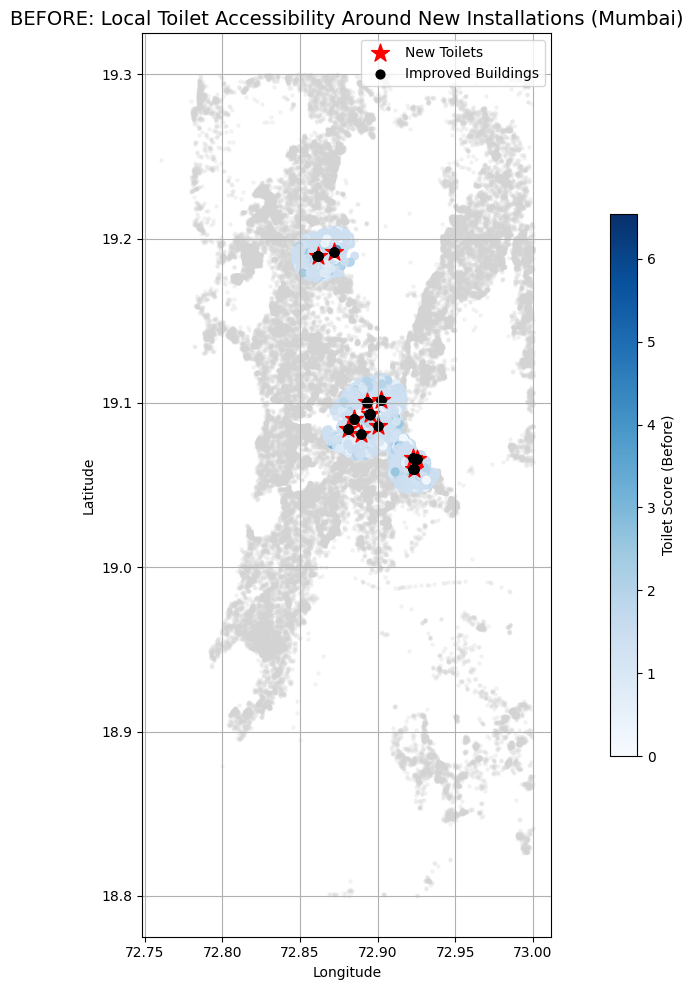

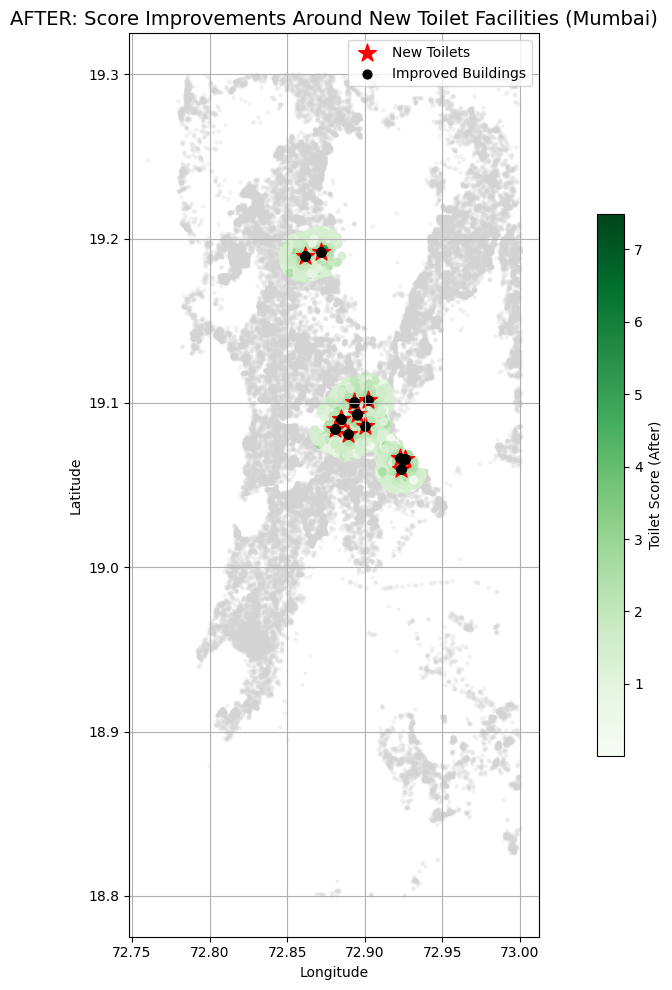

In [24]:
from geopy.distance import great_circle
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Efficient subset mask for residents near new toilets (within 1.5 km)
def compute_subset_mask(res_coords, facility_coords, radius_km=1.5):
    return np.array([
        min(great_circle(res, fac).km for fac in facility_coords) < radius_km
        for res in res_coords
    ])

# Step 2: Apply mask to filter data
heatmap_mask_toilet = compute_subset_mask(res_coords, new_toilet_coords_diverse, radius_km=1.5)
toilet_focus_before = residents_gdf[heatmap_mask_toilet].copy()
toilet_focus_after = residents_gdf[heatmap_mask_toilet].copy()

# Step 3: Assign plotting score columns
toilet_focus_before['Score'] = toilet_focus_before['Toilet_Score']
toilet_focus_after['Score'] = toilet_focus_after['Toilet_Score_Improved_Diverse']

# ----------------------- BEFORE -----------------------
fig, ax = plt.subplots(figsize=(12, 10))

# Background context
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)

# Local toilet score view
toilet_focus_before.plot(
    ax=ax,
    column='Score',
    cmap='Blues',
    markersize=30,
    alpha=0.9,
    legend=True,
    legend_kwds={'label': 'Toilet Score (Before)', 'shrink': 0.6}
)

# Overlay markers
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')

# Labels & layout
plt.title("BEFORE: Local Toilet Accessibility Around New Installations (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()

# ----------------------- AFTER -----------------------
fig, ax = plt.subplots(figsize=(12, 10))

# Background context
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)

# Improved toilet score view
toilet_focus_after.plot(
    ax=ax,
    column='Score',
    cmap='Greens',
    markersize=30,
    alpha=0.9,
    legend=True,
    legend_kwds={'label': 'Toilet Score (After)', 'shrink': 0.6}
)

# Overlay markers
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')

# Labels & layout
plt.title("AFTER: Score Improvements Around New Toilet Facilities (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()


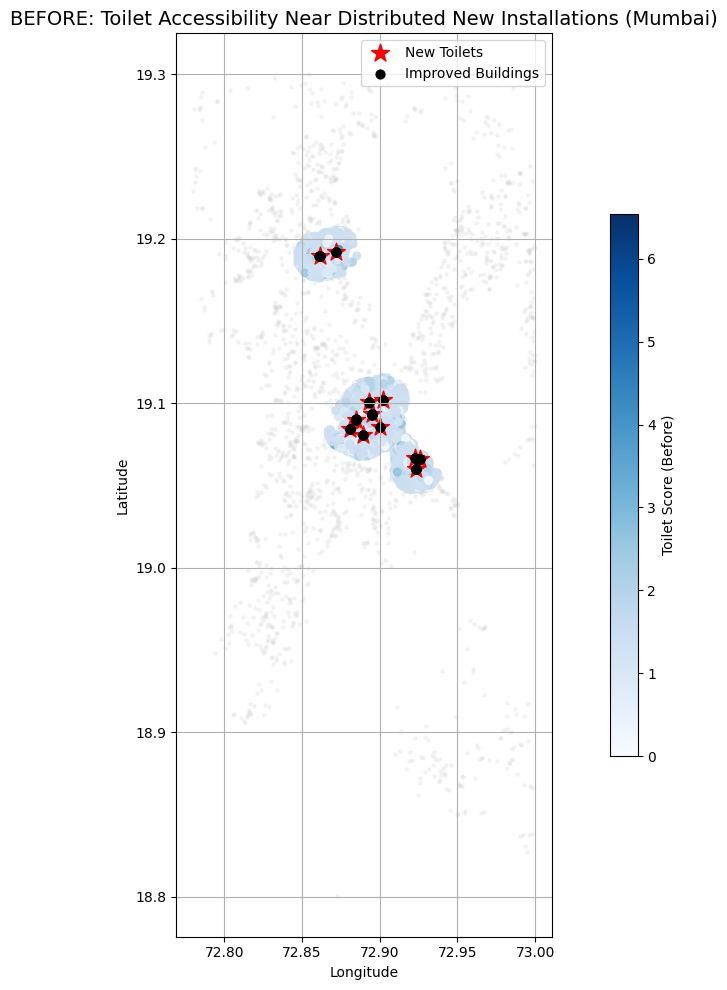

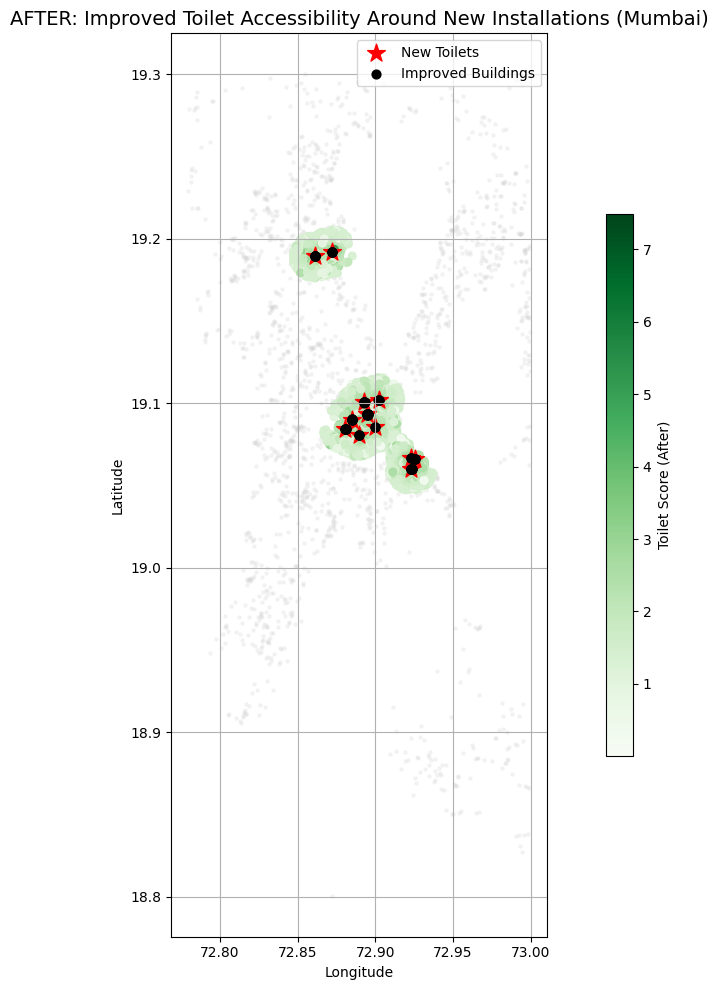

In [25]:
# Step 1: Sample background buildings to reduce rendering load
background_sample = residents_gdf.sample(2000, random_state=42)

# Step 2: Filter focused buildings near new toilets
toilet_focus_mask = compute_subset_mask(res_coords, new_toilet_coords_diverse, radius_km=1.5)
toilet_focus = residents_gdf[toilet_focus_mask].copy()
toilet_focus['Score_Before'] = toilet_focus['Toilet_Score']
toilet_focus['Score_After'] = toilet_focus['Toilet_Score_Improved_Diverse']

# ----------------------- BEFORE -----------------------
fig, ax = plt.subplots(figsize=(12, 10))

# Light background for spatial context
background_sample.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)

# Focused BEFORE scores
toilet_focus.plot(
    ax=ax,
    column='Score_Before',
    cmap='Blues',
    markersize=30,
    alpha=0.9,
    legend=True,
    legend_kwds={'label': 'Toilet Score (Before)', 'shrink': 0.6}
)

# Facility + impact overlays
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')

# Title and layout
plt.title("BEFORE: Toilet Accessibility Near Distributed New Installations (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()

# ----------------------- AFTER -----------------------
fig, ax = plt.subplots(figsize=(12, 10))

# Light background for spatial context
background_sample.plot(ax=ax, color='lightgray', markersize=5, alpha=0.2)

# Focused AFTER scores
toilet_focus.plot(
    ax=ax,
    column='Score_After',
    cmap='Greens',
    markersize=30,
    alpha=0.9,
    legend=True,
    legend_kwds={'label': 'Toilet Score (After)', 'shrink': 0.6}
)

# Facility + impact overlays
new_toilet_points_diverse.plot(ax=ax, color='red', marker='*', markersize=180, label='New Toilets')
highlighted_buildings_diverse.plot(ax=ax, color='black', marker='o', markersize=40, label='Improved Buildings')

# Title and layout
plt.title("AFTER: Improved Toilet Accessibility Around New Installations (Mumbai)", fontsize=14)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()


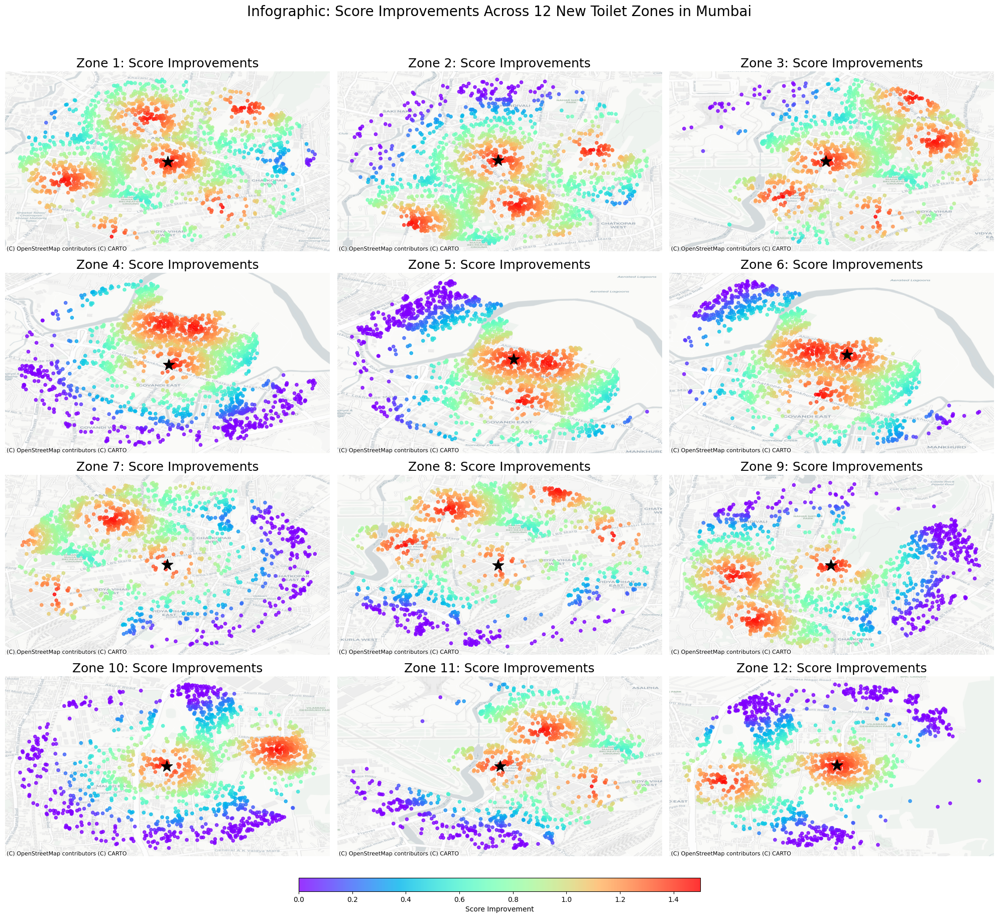

In [26]:
import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
from geopy.distance import geodesic

# Step 1: Create a 4x3 grid for 12 zones
fig, axs = plt.subplots(4, 3, figsize=(20, 18))
axs = axs.flatten()

# Collect all score changes for consistent colorbar range
all_score_changes = []

for point in new_toilet_points_diverse.geometry:
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()
    if not nearby.empty:
        nearby['Score_Change'] = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']
        all_score_changes.extend(nearby['Score_Change'].values)

# Set common color scale range
vmin, vmax = min(all_score_changes), max(all_score_changes)

# Step 2: Plot each zone
for idx, (point, ax) in enumerate(zip(new_toilet_points_diverse.geometry, axs)):
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()

    if nearby.empty:
        ax.set_title(f"Zone {idx+1}: No Data", fontsize=11)
        ax.axis('off')
        continue

    # Compute score difference
    nearby['Score_Change'] = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']

    # Reproject for basemap
    nearby_web = nearby.to_crs(epsg=3857)
    point_web = gpd.GeoSeries([point], crs="EPSG:4326").to_crs(epsg=3857)

    # Plot with consistent scale
    sc = ax.scatter(
        nearby_web.geometry.x,
        nearby_web.geometry.y,
        c=nearby_web['Score_Change'],
        cmap='rainbow',
        s=20,
        alpha=0.8,
        vmin=vmin,
        vmax=vmax
    )

    ax.scatter(point_web.geometry.x, point_web.geometry.y, color='black', marker='*', s=280, label='New Toilet')

    # Add basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=nearby_web.crs, zoom=15)

    ax.set_title(f"Zone {idx+1}: Score Improvements", fontsize=18)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_axis_off()

# Step 3: Add single horizontal colorbar
fig.tight_layout(rect=[0, 0.05, 1, 0.95])
cbar_ax = fig.add_axes([0.3, 0.02, 0.4, 0.015])  # Horizontal below the plots
fig.colorbar(sc, cax=cbar_ax, orientation='horizontal', label='Score Improvement')

# Add title and save
plt.suptitle("Infographic: Score Improvements Across 12 New Toilet Zones in Mumbai", fontsize=20, y=1.00)
fig.savefig("MumbaiToiletZone_Infographic_withBasemap.png", dpi=300, bbox_inches='tight')
plt.show()


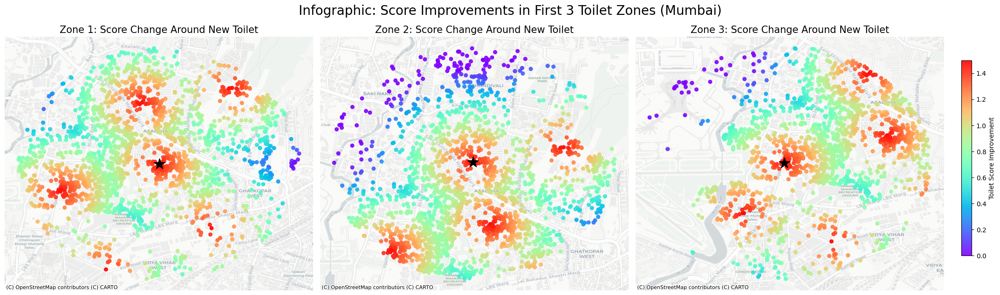

In [27]:
import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
from geopy.distance import geodesic

# Step 1: Prepare the 1x3 subplot layout
fig, axs = plt.subplots(1, 3, figsize=(22, 6))
axs = axs.flatten()

# Step 2: Gather consistent min/max values for color scaling
all_score_changes = []
for point in new_toilet_points_diverse.geometry[:3]:
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ]
    if not nearby.empty:
        deltas = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']
        all_score_changes.extend(deltas.values)

vmin, vmax = min(all_score_changes), max(all_score_changes)

# Step 3: Plot each of the 3 zones with basemap
for idx, (point, ax) in enumerate(zip(new_toilet_points_diverse.geometry[:3], axs)):
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()

    if nearby.empty:
        ax.set_title(f"Zone {idx+1}: No Data")
        ax.axis('off')
        continue

    # Calculate score change
    nearby['Score_Change'] = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']

    # Reproject to EPSG:3857 for compatibility with basemap
    nearby_web = nearby.to_crs(epsg=3857)
    point_web = gpd.GeoSeries([point], crs="EPSG:4326").to_crs(epsg=3857)

    # Plot residents
    sc = ax.scatter(
        nearby_web.geometry.x,
        nearby_web.geometry.y,
        c=nearby_web['Score_Change'],
        cmap='rainbow',
        s=30,
        alpha=0.9,
        vmin=vmin,
        vmax=vmax
    )

    # Plot new toilet location
    ax.scatter(point_web.geometry.x, point_web.geometry.y, color='black', marker='*', s=300, label='New Toilet')

    # Add basemap
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=nearby_web.crs, zoom=15)

    # Format subplot
    ax.set_title(f"Zone {idx+1}: Score Change Around New Toilet", fontsize=15)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_axis_off()

# Step 4: Layout and shared colorbar
fig.tight_layout(rect=[0, 0, 0.93, 1])
cbar_ax = fig.add_axes([0.94, 0.15, 0.01, 0.7])
fig.colorbar(sc, cax=cbar_ax, label='Toilet Score Improvement')

# Title
plt.suptitle("Infographic: Score Improvements in First 3 Toilet Zones (Mumbai)", fontsize=20, y=1.05)

# Save if needed
plt.savefig("3Mumbai_ToiletZones_First3_Infographic_withBasemap.png", dpi=300, bbox_inches='tight')
plt.show()


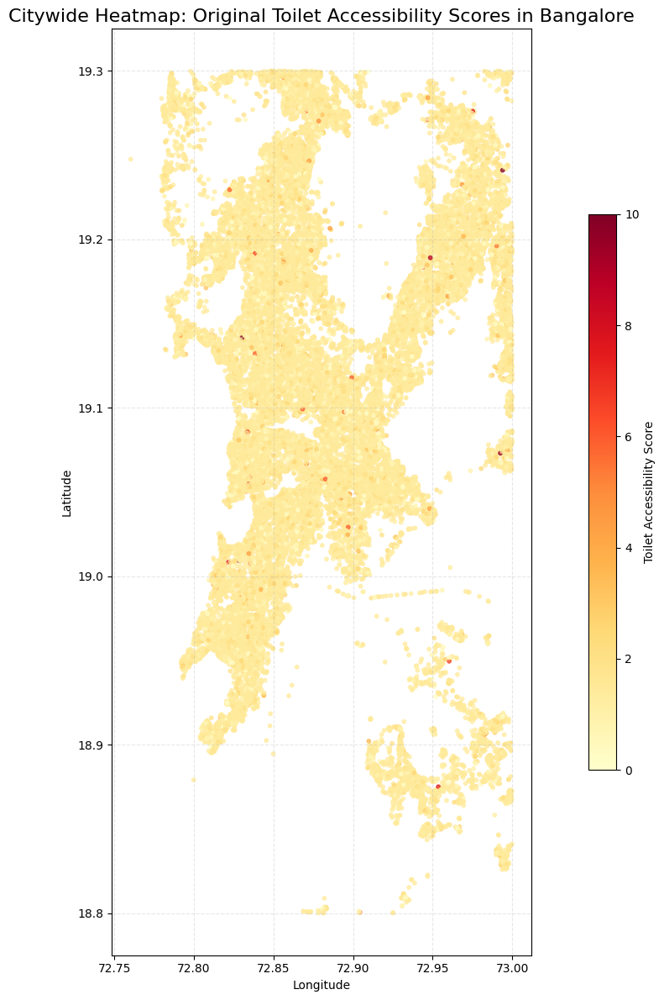

In [28]:
fig, ax = plt.subplots(figsize=(14, 12))

# Plot all buildings with their original Toilet Score
residents_gdf.plot(
    ax=ax,
    column='Toilet_Score',
    cmap='YlOrRd',
    markersize=10,
    alpha=0.7,
    legend=True,
    legend_kwds={'label': 'Toilet Accessibility Score', 'shrink': 0.6}
)

# Formatting for clarity
plt.title("Citywide Heatmap: Original Toilet Accessibility Scores in Bangalore", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


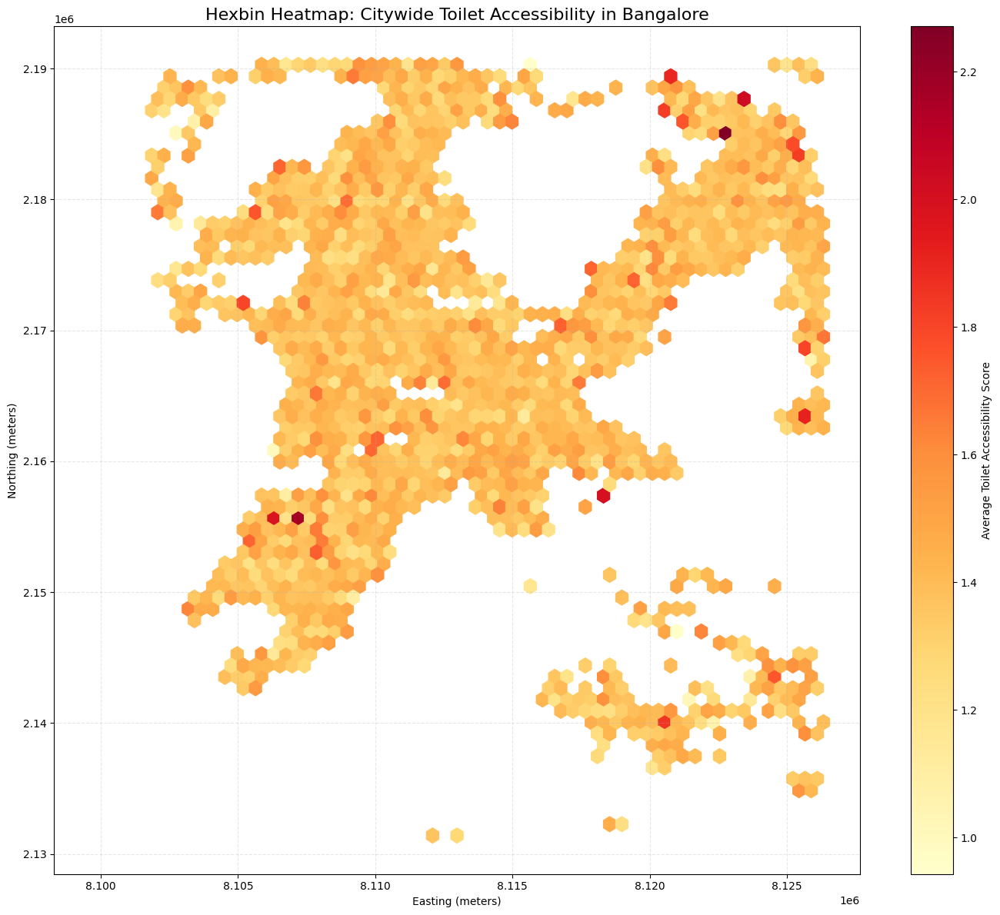

In [29]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Reproject to Web Mercator (EPSG:3857) for distance-aware binning
residents_proj = residents_gdf.to_crs(epsg=3857)

# Step 2: Extract x, y coordinates and Toilet Scores
x = residents_proj.geometry.x
y = residents_proj.geometry.y
scores = residents_proj['Toilet_Score']

# Step 3: Plot Hexbin heatmap
fig, ax = plt.subplots(figsize=(14, 12))
hb = ax.hexbin(
    x, y,
    C=scores,
    gridsize=60,
    cmap='YlOrRd',
    reduce_C_function=np.mean,
    mincnt=5
)

# Step 4: Add colorbar and labels
cb = fig.colorbar(hb, ax=ax)
cb.set_label('Average Toilet Accessibility Score')

ax.set_title("Hexbin Heatmap: Citywide Toilet Accessibility in Bangalore", fontsize=16)
ax.set_xlabel("Easting (meters)")
ax.set_ylabel("Northing (meters)")
ax.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
from geopy.distance import geodesic

# Create a 4x3 grid for the 12 toilet zones
fig, axs = plt.subplots(4, 3, figsize=(20, 18))
axs = axs.flatten()

# Extract shared color scaling
all_score_changes = []
for point in new_toilet_points_diverse.geometry:
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ]
    if not nearby.empty:
        delta = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']
        all_score_changes.extend(delta.values)

vmin, vmax = min(all_score_changes), max(all_score_changes)

# Plot each zone with coordinates labeled
for idx, (point, ax) in enumerate(zip(new_toilet_points_diverse.geometry, axs)):
    nearby = residents_gdf[
        residents_gdf.geometry.apply(lambda g: geodesic((g.y, g.x), (point.y, point.x)).km < 1.5)
    ].copy()

    if nearby.empty:
        ax.set_title(f"Zone {idx+1}: No Data")
        ax.axis('off')
        continue

    nearby['Score_Change'] = nearby['Toilet_Score_Improved_Diverse'] - nearby['Toilet_Score']

    sc = ax.scatter(
        nearby.geometry.x,
        nearby.geometry.y,
        c=nearby['Score_Change'],
        cmap='YlOrRd',
        s=20,
        alpha=0.8,
        vmin=vmin,
        vmax=vmax
    )

    # Plot toilet marker and label coordinates
    ax.scatter(point.x, point.y, color='red', marker='*', s=180, label='New Toilet')
    coord_label = f"({round(point.y, 4)}, {round(point.x, 4)})"
    ax.text(point.x, point.y - 0.001, coord_label, fontsize=8, ha='center', va='top', color='black')

    ax.set_title(f"Zone {idx+1}: Score Improvements Around New Toilet", fontsize=12)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.grid(True)

# Final layout and colorbar
fig.tight_layout(rect=[0, 0, 0.9, 1])
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
fig.colorbar(sc, cax=cbar_ax, label='Score Improvement')

plt.suptitle("Infographic: Score Improvements Across 12 New Toilet Zones (Mumbai)", fontsize=20, y=1.02)
plt.show()


In [ ]:
import geopandas as gpd
from shapely.geometry import Point
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt

# Step 1: Parse KML file into GeoDataFrame
def parse_kml_to_gdf(kml_path, name):
    namespace = {'kml': 'http://www.opengis.net/kml/2.2'}
    tree = ET.parse(kml_path)
    root = tree.getroot()
    coords = []
    for placemark in root.findall('.//kml:Placemark', namespace):
        coord = placemark.find('.//kml:coordinates', namespace)
        if coord is not None:
            lon, lat, *_ = map(float, coord.text.strip().split(','))
            coords.append(Point(lon, lat))
    return gpd.GeoDataFrame({'name': [name]*len(coords), 'geometry': coords}, crs="EPSG:4326")

# Step 2: Load Metro stations from uploaded KML
metro_stations_gdf = parse_kml_to_gdf("bengaluru-metro-stations.kml", "Metro Station")

# Step 3: Select top 100 residential buildings based on Metro Score
preferred_residents = residents_gdf.sort_values("Metro_Score", ascending=False).head(100)

# Step 4: Plot the scenario map
fig, ax = plt.subplots(figsize=(14, 12))

# All buildings in light gray for context
residents_gdf.plot(ax=ax, color='lightgray', markersize=5, alpha=0.3, label='Other Buildings')

# Highlight top 100 buildings based on Metro Score
preferred_residents.plot(ax=ax, color='green', markersize=30, label='Preferred Buildings')

# Metro station markers
metro_stations_gdf.plot(ax=ax, color='red', marker='*', markersize=120, label='Metro Stations')

# Map details
plt.title("Scenario Map: Preferred Residential Buildings Near Metro Stations (Bangalore)", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Step 1: Define facility thresholds and styles
facility_thresholds = {
    "Metro_Score":    {"color": "green",  "label": "Metro Score ≥ 8",     "threshold": 8},
    "School_Score":   {"color": "blue",   "label": "School Score ≥ 5",    "threshold": 5},
    "Toilet_Score":   {"color": "orange", "label": "Toilet Score ≥ 8",    "threshold": 8},
    "Hospital_Score": {"color": "purple", "label": "Hospital Score ≥ 8",  "threshold": 8},
    "Park_Score":     {"color": "brown",  "label": "Park Score ≥ 9",      "threshold": 9},
    "Fire_Score":     {"color": "red",    "label": "Fire Score ≥ 9",      "threshold": 9},
    "Meal_Score":     {"color": "gold",   "label": "Meal Score ≥ 8",      "threshold": 8}
}

# Step 2: Start base map
fig, ax = plt.subplots(figsize=(14, 12))

# Plot all buildings as background
residents_gdf.plot(ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings')

# Step 3: Overlay high-scoring buildings by facility
for col, details in facility_thresholds.items():
    if col in residents_gdf.columns:
        high_df = residents_gdf[residents_gdf[col] >= details["threshold"]]
        if not high_df.empty:
            high_df.plot(
                ax=ax,
                color=details["color"],
                markersize=10,
                label=details["label"]
            )

# Step 4: Final formatting
plt.title("Buildings with High Accessibility Scores by Facility Type", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import xml.etree.ElementTree as ET

# Helper to parse KML to GeoDataFrame
def parse_kml_to_gdf(kml_path, label):
    namespace = {'kml': 'http://www.opengis.net/kml/2.2'}
    tree = ET.parse(kml_path)
    root = tree.getroot()
    coords = []
    for placemark in root.findall('.//kml:Placemark', namespace):
        coord = placemark.find('.//kml:coordinates', namespace)
        if coord is not None:
            lon, lat, *_ = map(float, coord.text.strip().split(','))
            coords.append(Point(lon, lat))
    return gpd.GeoDataFrame({'type': [label] * len(coords), 'geometry': coords}, crs="EPSG:4326")

# Mumbai-specific facilities & scores
facilities = {
    "Transport": {
        "score_col": "Transport_Score",
        "color": "green",
        "marker_color": "red",
        "marker_file": "mumbai-best-bus-stops-depots.kml"
    },
    "School": {
        "score_col": "School_Score",
        "color": "blue",
        "marker_color": "black",
        "marker_file": [
            "mumbai-municipal-primary-secondary-schools.kml",
            "mumbai-unaided-schools.kml",
            "mumbai-aided-schools.kml"
        ]
    },
    "Toilet": {
        "score_col": "Toilet_Score",
        "color": "orange",
        "marker_color": "purple",
        "marker_file": "mumbai-toilets.kml"
    },
    "Hospital": {
        "score_col": "Hospital_Score",
        "color": "pink",
        "marker_color": "maroon",
        "marker_file": "mumbai-hospitals.kml"
    },
    "Park": {
        "score_col": "Park_Score",
        "color": "olive",
        "marker_color": "darkgreen",
        "marker_file": "mumbai-gardens-parks-playgrounds.kml"
    },
    "Fire": {
        "score_col": "Fire_Score",
        "color": "firebrick",
        "marker_color": "black",
        "marker_file": "mumbai-fire-stations.kml"
    }
}

# Plot for each facility
for name, data in facilities.items():
    score_col = data["score_col"]
    if score_col not in residents_gdf.columns:
        print(f"Skipping {name} – missing column {score_col}")
        continue

    try:
        high_score_buildings = residents_gdf[residents_gdf[score_col] >= 8]

        # Parse single or multiple KML files
        if isinstance(data["marker_file"], list):
            marker_dfs = [parse_kml_to_gdf(f, name) for f in data["marker_file"]]
            markers = gpd.GeoDataFrame(pd.concat(marker_dfs, ignore_index=True), crs="EPSG:4326")
        else:
            markers = parse_kml_to_gdf(data["marker_file"], name)

        fig, ax = plt.subplots(figsize=(14, 12))

        # Background (sample for speed)
        residents_gdf.sample(min(3000, len(residents_gdf)), random_state=42).plot(
            ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings'
        )

        # Highlight high-score buildings
        high_score_buildings.plot(
            ax=ax, color=data["color"], markersize=25, label=f'{name} Score ≥ 8'
        )

        # Plot facilities
        markers.plot(
            ax=ax, color=data["marker_color"], marker='*', markersize=120, label=f'{name} Locations'
        )

        # Styling
        plt.title(f"Mumbai: {name} Score ≥ 8 and Facility Locations", fontsize=16)
        plt.xlabel("Longitude")
        plt.ylabel("Latitude")
        plt.legend(loc='upper right')
        plt.grid(True, linestyle='--', alpha=0.3)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Error plotting {name}: {e}")


In [ ]:
pip install contextily

In [ ]:
import matplotlib.pyplot as plt

# Step 1: Define relevant facility score columns
facility_cols = [
    "Metro_Score", "School_Score", "Toilet_Score",
    "Hospital_Score", "Park_Score", "Meal_Score", "Fire_Score"
]

# Filter only those columns present in the DataFrame
valid_facility_cols = [col for col in facility_cols if col in residents_gdf.columns]

# Step 2: Compute MultiAccess Score as mean of available facility scores
residents_gdf["MultiAccess_Score"] = residents_gdf[valid_facility_cols].mean(axis=1)

# Step 3: Identify bottom 10% threshold
low_score_threshold = residents_gdf["MultiAccess_Score"].quantile(0.1)

# Subset low-score buildings
low_access_residents = residents_gdf[residents_gdf["MultiAccess_Score"] <= low_score_threshold].copy()

# Step 4: Plot map
fig, ax = plt.subplots(figsize=(14, 12))

# Base context (light sampling of total buildings)
residents_gdf.sample(min(3000, len(residents_gdf)), random_state=42).plot(
    ax=ax, color='lightgray', markersize=3, alpha=0.3, label='Other Buildings'
)

# Heatmap of MultiAccess Score
residents_gdf.plot(
    ax=ax, column="MultiAccess_Score", cmap="YlGnBu", markersize=10, alpha=0.7, legend=True,
    legend_kwds={'label': "Average Accessibility Score", 'shrink': 0.6}
)

# Highlight underserved zones
low_access_residents.plot(
    ax=ax, color='red', markersize=20, label='Bottom 10% Accessibility'
)

# Final map formatting
plt.title("Citywide Multi-Access Score & Low Score Regions (Across All Facilities)", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
# Step 1: Create quantile-based thresholds
q_low = residents_gdf["MultiAccess_Score"].quantile(0.33)
q_high = residents_gdf["MultiAccess_Score"].quantile(0.67)

# Step 2: Classify each building into a tier
def classify_access(score):
    if score < q_low:
        return "Low"
    elif score < q_high:
        return "Medium"
    else:
        return "High"

residents_gdf["Access_Tier"] = residents_gdf["MultiAccess_Score"].apply(classify_access)

# Step 3: Define color mapping
tier_colors = {
    "High": "green",
    "Medium": "orange",
    "Low": "red"
}

# Step 4: Plot classification with Low on top
fig, ax = plt.subplots(figsize=(14, 12))

# Background
residents_gdf.sample(min(3000, len(residents_gdf)), random_state=42).plot(
    ax=ax, color='lightgray', markersize=3, alpha=0.2, label='Other Buildings'
)

# Plot in reverse priority so Low is on top
for tier in ["High", "Medium", "Low"]:
    tier_df = residents_gdf[residents_gdf["Access_Tier"] == tier]
    tier_df.plot(ax=ax, color=tier_colors[tier], markersize=12, label=f'{tier} Access')

# Final styling
plt.title("Multi-Access Tier Classification (Low on Top)", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# Step 1: Load full dataset and convert to GeoDataFrame
residents_df = pd.read_csv("MumbaiScoreV1.csv", engine="python")
residents_gdf = gpd.GeoDataFrame(
    residents_df,
    geometry=gpd.points_from_xy(residents_df.longitude, residents_df.latitude),
    crs="EPSG:4326"
)

# Step 2: Define the facility columns for MultiAccess Score
facility_cols = [
    "School_Score", "Toilet_Score", "Hospital_Score",
    "Park_Score", "Fire_Score", "Meal_Score"
]
valid_cols = [col for col in facility_cols if col in residents_gdf.columns]

# Step 3: Compute average MultiAccess Score
residents_gdf["MultiAccess_Score"] = residents_gdf[valid_cols].mean(axis=1)

# Step 4: Identify bottom 10% of buildings
low_threshold = residents_gdf["MultiAccess_Score"].quantile(0.1)
low_access_buildings = residents_gdf[residents_gdf["MultiAccess_Score"] <= low_threshold].sample(
    min(3000, int(len(residents_gdf) * 0.1)), random_state=42
)

# Step 5: Plot the MultiAccess score map
fig, ax = plt.subplots(figsize=(14, 12))

# Background sampling for context
residents_gdf.sample(min(3000, len(residents_gdf)), random_state=42).plot(
    ax=ax, color="lightgray", markersize=3, alpha=0.3, label="Other Buildings"
)

# MultiAccess Score Heatmap
residents_gdf.plot(
    ax=ax,
    column="MultiAccess_Score",
    cmap="YlGnBu",
    markersize=10,
    alpha=0.7,
    legend=True,
    legend_kwds={'label': "Avg Facility Score", 'shrink': 0.6}
)

# Highlight bottom 10% underserved areas
low_access_buildings.plot(
    ax=ax,
    color="red",
    markersize=30,
    label="Low MultiAccess Score (Bottom 10%)"
)

# Final layout and styling
plt.title("Citywide Multi-Access Score (All Facilities) & Underserved Zones", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
# Step 1: Define tier breakpoints
q_low = residents_gdf["MultiAccess_Score"].quantile(0.33)
q_high = residents_gdf["MultiAccess_Score"].quantile(0.67)

# Step 2: Classify access tiers
def assign_tier(score):
    if score < q_low:
        return "Low"
    elif score < q_high:
        return "Medium"
    else:
        return "High"

residents_gdf["Access_Tier"] = residents_gdf["MultiAccess_Score"].apply(assign_tier)

# Step 3: Plot access tier map
tier_colors = {"Low": "red", "Medium": "orange", "High": "green"}

fig, ax = plt.subplots(figsize=(14, 12))

# Reverse plotting order: High → Medium → Low (so Low is on top)
for tier in ["High", "Medium", "Low"]:
    tier_df = residents_gdf[residents_gdf["Access_Tier"] == tier]
    tier_df.plot(ax=ax, color=tier_colors[tier], markersize=12, label=f"{tier} Access")

plt.title("Citywide Access Tier Classification (Low on Top)", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
from shapely.geometry import Point
from geopy.distance import geodesic
import numpy as np

# Pick a centroid of low-access buildings as the new facility site
new_park_location = low_access_buildings.geometry.unary_union.centroid


In [ ]:
def simulate_facility_boost(
    gdf, facility_point, col_name,
    boost_range_km=1.2, max_boost=1.5,
    score_cap=10.0, new_col_name=None
):
    if new_col_name is None:
        new_col_name = f"{col_name}_Improved"

    gdf[new_col_name] = gdf.apply(
        lambda row: apply_boost(row, facility_point, col_name), axis=1
    )
    return gdf
residents_gdf = simulate_facility_boost(residents_gdf, new_park_location, "Park_Score")


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
from geopy.distance import geodesic

# Define new simulated park location in Mumbai (you can change this)
new_park_location = Point(72.8567, 19.0760)  # Example: Dadar

# Boost settings
boost_range_km = 1.2
max_boost = 1.5

# Boost function
def apply_boost(row, facility_point, col_name):
    distance_km = geodesic((row.geometry.y, row.geometry.x), (facility_point.y, facility_point.x)).km
    if distance_km < boost_range_km:
        boost = (1 - distance_km / boost_range_km) * max_boost
        return min(row[col_name] + boost, 10.0)
    return row[col_name]

# Apply park score boost
residents_gdf["Park_Score_Improved"] = residents_gdf.apply(
    lambda r: apply_boost(r, new_park_location, "Park_Score"), axis=1
)

# Recompute MultiAccess Score using only Mumbai-relevant scores
mumbai_cols = [
    "School_Score", "Transport_Score", "Fire_Score",
    "Hospital_Score", "Park_Score_Improved", "Toilet_Score"
]
residents_gdf["MultiAccess_Score_Improved"] = residents_gdf[mumbai_cols].mean(axis=1)

# Original score (if not already present)
if "MultiAccess_Score" not in residents_gdf.columns:
    original_cols = mumbai_cols.copy()
    original_cols[original_cols.index("Park_Score_Improved")] = "Park_Score"
    residents_gdf["MultiAccess_Score"] = residents_gdf[original_cols].mean(axis=1)

# Calculate score change
residents_gdf["Score_Change"] = residents_gdf["MultiAccess_Score_Improved"] - residents_gdf["MultiAccess_Score"]

# Plot heatmap
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(
    ax=ax,
    column="Score_Change",
    cmap="YlOrRd",
    markersize=10,
    alpha=0.8,
    legend=True,
    legend_kwds={'label': 'MultiAccess Score Change', 'shrink': 0.6}
)
gpd.GeoSeries([new_park_location], crs="EPSG:4326").plot(
    ax=ax, color='black', marker='*', markersize=200, label='New Park'
)

plt.title("Mumbai: Impact of New Park on MultiAccess Scores (Simulated)", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
from geopy.distance import geodesic
from sklearn.neighbors import KernelDensity
import matplotlib.pyplot as plt

# Load Mumbai scores (adjust path if needed)
residents_df = pd.read_csv("MumbaiScoreV1.csv", engine="python", nrows=100000)
residents_gdf = gpd.GeoDataFrame(
    residents_df,
    geometry=gpd.points_from_xy(residents_df.longitude, residents_df.latitude),
    crs="EPSG:4326"
)

# Step 1: Compute current MultiAccess Score (Mumbai-specific)
facility_cols = [
    "School_Score", "Toilet_Score", "Hospital_Score",
    "Park_Score", "Fire_Score", "Transport_Score"
]
valid_cols = [col for col in facility_cols if col in residents_gdf.columns]
residents_gdf["MultiAccess_Score"] = residents_gdf[valid_cols].mean(axis=1)

# Step 2: Get low-access buildings (bottom 10%)
low_threshold = residents_gdf["MultiAccess_Score"].quantile(0.1)
low_access_buildings = residents_gdf[residents_gdf["MultiAccess_Score"] <= low_threshold].sample(
    min(3000, int(len(residents_gdf) * 0.1)), random_state=42
)

# Step 3: KDE clustering to propose new facility sites
low_coords = np.array([(g.y, g.x) for g in low_access_buildings.geometry])
xy = np.vstack([low_coords[:, 1], low_coords[:, 0]]).T
kde = KernelDensity(bandwidth=0.01)
kde.fit(xy)
densities = kde.score_samples(xy)

low_access_buildings['density'] = densities
top10_points = low_access_buildings.sort_values("density", ascending=False).drop_duplicates("geometry").head(10)
new_facility_points = gpd.GeoDataFrame(geometry=top10_points.geometry, crs="EPSG:4326")
new_facility_coords = np.array([(g.y, g.x) for g in new_facility_points.geometry])

# Step 4: Apply proximity-based score boost
res_coords = np.array([(g.y, g.x) for g in residents_gdf.geometry])
min_distances = np.min([[geodesic(f, t).km for t in new_facility_coords] for f in res_coords], axis=1)
simulated_boost = np.clip((1 - min_distances / 1.2) * 1.5, 0, None)
residents_gdf['Simulated_MultiAccess'] = np.clip(residents_gdf['MultiAccess_Score'] + simulated_boost, 0, 10)

# Step 5: Plot result
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, column='Simulated_MultiAccess', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)
new_facility_points.plot(ax=ax, color='red', marker='*', markersize=200, label='New Simulated Facility')

plt.title("Mumbai: Simulated Multi-Access Score After 10 New Facilities", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Import libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import Point
from geopy.distance import geodesic
from sklearn.neighbors import KernelDensity

# Load Mumbai dataset (sample 100k rows for performance)
residents_df = pd.read_csv("MumbaiScoreV1.csv", engine="python", nrows=100000)
residents_gdf = gpd.GeoDataFrame(
    residents_df,
    geometry=gpd.points_from_xy(residents_df.longitude, residents_df.latitude),
    crs="EPSG:4326"
)

# Compute MultiAccess Score (Mumbai-specific scores only)
facility_cols = [
    "School_Score", "Toilet_Score", "Hospital_Score",
    "Park_Score", "Fire_Score", "Transport_Score"
]
valid_cols = [col for col in facility_cols if col in residents_gdf.columns]
residents_gdf["MultiAccess_Score"] = residents_gdf[valid_cols].mean(axis=1)

# Identify bottom 10% of buildings
low_threshold = residents_gdf["MultiAccess_Score"].quantile(0.1)
low_access_buildings = residents_gdf[residents_gdf["MultiAccess_Score"] <= low_threshold].sample(
    min(3000, int(len(residents_gdf) * 0.1)), random_state=42
)

# KDE clustering on low-access buildings
low_coords = np.array([(g.y, g.x) for g in low_access_buildings.geometry])
xy = np.vstack([low_coords[:, 1], low_coords[:, 0]]).T
kde = KernelDensity(bandwidth=0.01)
kde.fit(xy)
densities = kde.score_samples(xy)
low_access_buildings['density'] = densities

# Select top 10 proposed facility points
top10_points = low_access_buildings.sort_values("density", ascending=False).drop_duplicates("geometry").head(10)

# Plot results
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, column='MultiAccess_Score', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)
low_access_buildings.plot(ax=ax, color='red', markersize=25, label='Bottom 10% MultiAccess')
top10_points.plot(ax=ax, color='black', marker='*', markersize=120, label='Proposed New Facility')

plt.title("Mumbai: Optimal Facility Locations to Improve MultiAccess Score", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import Point
from geopy.distance import geodesic
from sklearn.neighbors import KernelDensity

# Load Mumbai dataset (use partial load for memory efficiency)
residents_df = pd.read_csv("MumbaiScoreV1.csv", engine="python", nrows=100000)
residents_gdf = gpd.GeoDataFrame(
    residents_df,
    geometry=gpd.points_from_xy(residents_df.longitude, residents_df.latitude),
    crs="EPSG:4326"
)

# Step 1: Recalculate MultiAccess Score using all relevant Mumbai facilities
facility_cols = [
    "School_Score", "Toilet_Score", "Hospital_Score",
    "Park_Score", "Fire_Score", "Transport_Score"
]
valid_cols = [col for col in facility_cols if col in residents_gdf.columns]
residents_gdf["MultiAccess_Score"] = residents_gdf[valid_cols].mean(axis=1)

# Step 2: Identify bottom 10% of buildings by MultiAccess Score
low_threshold = residents_gdf["MultiAccess_Score"].quantile(0.1)
low_access_buildings = residents_gdf[residents_gdf["MultiAccess_Score"] <= low_threshold].copy()

# Step 3: Force spatial diversity using ~1km lat/lon bins
low_access_buildings['lat_bin'] = low_access_buildings.geometry.y.round(2)
low_access_buildings['lon_bin'] = low_access_buildings.geometry.x.round(2)
diverse_candidates = low_access_buildings.drop_duplicates(subset=['lat_bin', 'lon_bin'])

# Step 4: KDE on spatially diverse candidates
xy = np.vstack([diverse_candidates.geometry.x, diverse_candidates.geometry.y]).T
kde = KernelDensity(bandwidth=0.01)
kde.fit(xy)
diverse_candidates['density'] = kde.score_samples(xy)
top10_points_diverse = diverse_candidates.sort_values("density", ascending=False).head(30)

# Step 5: Create new facility points and compute distance-based boost
new_facility_points = gpd.GeoDataFrame(geometry=top10_points_diverse.geometry, crs="EPSG:4326")
new_facility_coords = np.array([(pt.y, pt.x) for pt in new_facility_points.geometry])
res_coords = np.array([(g.y, g.x) for g in residents_gdf.geometry])
min_distances = np.min([[geodesic(f, t).km for t in new_facility_coords] for f in res_coords], axis=1)
simulated_boost = np.clip((1 - min_distances / 1.2) * 1.5, 0, None)
residents_gdf['Simulated_MultiAccess'] = np.clip(residents_gdf['MultiAccess_Score'] + simulated_boost, 0, 10)

# Step 6: Plotting
fig, ax = plt.subplots(figsize=(14, 12))
residents_gdf.plot(ax=ax, column='Simulated_MultiAccess', cmap='YlGnBu', markersize=10, alpha=0.7, legend=True)
new_facility_points.plot(ax=ax, color='red', marker='*', markersize=200, label='New Simulated Facility')
plt.title("Mumbai: Improved Multi-Access Scores After 50 New Diverse Facilities", fontsize=16)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import contextily as ctx

# Reproject GeoDataFrames to Web Mercator for basemap compatibility
sampled_gdf_web = sampled_gdf.to_crs(epsg=3857)
# Assign facility types first
facility_labels = ['Toilet', 'Transport', 'School', 'Hospital', 'Park', 'Fire'] * 10
top_points_diverse['Recommended'] = facility_labels[:len(top_points_diverse)]

# THEN convert to GeoDataFrame and reproject
new_facility_points = gpd.GeoDataFrame(top_points_diverse, crs="EPSG:4326")
facility_points_web = new_facility_points.to_crs(epsg=3857)


# Begin plot
fig, ax = plt.subplots(figsize=(14, 12))
sampled_gdf_web.plot(
    ax=ax,
    column='Simulated_MultiAccess',
    cmap='plasma',
    markersize=10,
    alpha=0.4,
    legend=True,
    legend_kwds={'label': "Simulated MultiAccess Score", 'shrink': 0.6}
)

# Add facility markers with black borders
for category, style in marker_styles.items():
    subset = facility_points_web[facility_points_web['Recommended'] == category]
    subset.plot(
        ax=ax,
        color=style['color'],
        marker=style['marker'],
        markersize=100,
        edgecolor='black',      # Black border
        linewidth=0.7,          # Border thickness
        label=category
    )

# Add a modern basemap layer
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=sampled_gdf_web.crs)

# Aesthetic touches
ax.set_title("Mumbai: Multi-Access Improvement with New Diverse Facilities", fontsize=16)
ax.set_axis_off()
ax.legend(loc='lower left')
plt.tight_layout()
plt.savefig("MumbaiFacility_withBasemap.png", dpi=300)
plt.show()
